# Compare `profiles_v3.hdf5` (NMAX=1000) vs `profiles_v5_10k.hdf5` (NMAX=10000) average OT maps

Same halo catalog (`final_matched.hdf5`), same pipeline (`Build_profiles_10k.ipynb`), same random
seed -- the only intentional difference between the two files is the per-bin halo cap.
`select_halos()` only draws a random subsample when more matched halos exist in a bin than the
cap allows, so:

- bins where fewer than 1000 halos were ever available use the **exact same halo sample** in
  both files (v3 uncapped, `n_halos < nmax`) -- these should match almost exactly, any
  difference is just floating point.
- bins that hit the v3 cap (`n_halos == 1000`, typically the common low-mass bins) are the ones
  where v5's extra halos can actually move the average OT map -- that's the interesting
  comparison.

**Known gap:** `profiles_v3.hdf5` is missing `69/Mstar-1sigma` entirely (a source-file defect in
that one snapshot, only gap-filled in v5) -- excluded automatically below wherever both files are
compared.

In [53]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 16, "axes.titlesize": 18, "axes.labelsize": 16,
    "legend.fontsize": 13, "xtick.labelsize": 13, "ytick.labelsize": 13,
    "figure.titlesize": 20, "figure.dpi": 110,
})
import h5py


In [54]:
PATH = "/Users/jpaine/Desktop/Flamingo/"
SNAP_Z = {9:5.,13:4.,17:3.,37:2.,47:1.5,57:1.,62:.75,67:.5,69:.4,71:.3,73:.2,75:.1,77:0.}
SIMS = ["fgas+2sigma","fgas-2sigma","fgas-4sigma","fgas-8sigma",
        "Mstar-1sigma","Mstar-1sigma_fgas-4sigma","Jet","Jet_fgas-4sigma"]


In [55]:
# Read in both profile files -- skip too big
f3 = h5py.File(f"{PATH}profiles_v3.hdf5", "r")       # NMAX=1000
f5 = h5py.File(f"{PATH}profiles_v5_10k.hdf5", "r")   # NMAX=10000

# each file: {snap}/{sim}/{lo:.3f}_{hi:.3f}/ group, containing per-halo dmo/hyd profiles
# (m_dmo/m_hyd), the average histograms (avg_dmo/avg_hyd), and the OT map (ot = T(r), the
# mapped radius -- the displacement amplitude people actually plot is T(r) - r, see below)

n3 = sum(len(f3[s][sim]) for s in f3 for sim in f3[s])
n5 = sum(len(f5[s][sim]) for s in f5 for sim in f5[s])
c3 = sum(1 for s in f3 for sim in f3[s])
c5 = sum(1 for s in f5 for sim in f5[s])
print(f"v3: {n3} bins across {c3} snap/sim combos")
print(f"v5: {n5} bins across {c5} snap/sim combos")
print("69/Mstar-1sigma present in v3:", "Mstar-1sigma" in f3.get("69", {}))


v3: 4120 bins across 103 snap/sim combos
v5: 4160 bins across 104 snap/sim combos
69/Mstar-1sigma present in v3: False


In [56]:
def load_bin(f, snap, sim, lo, hi):
    """Read one saved bin IN FULL (attrs + every dataset, incl. per-halo m_dmo/m_hyd) -- use
    for detailed single-bin exploration, not for looping over many bins (see load_ot below)."""
    key = f"{snap}/{sim}/{lo:.3f}_{hi:.3f}"
    if key not in f:
        return None
    g = f[key]
    r = {**{k: g.attrs[k] for k in g.attrs}, **{k: g[k][...] for k in g.keys()}}
    r["snap"], r["sim"] = snap, sim
    return r

def load_ot(f, snap, sim, lo, hi):
    """Lightweight loader for looping over many bins: attrs + just 'ot'/'rc', skipping the
    big per-halo arrays (m_dmo/m_hyd -- shape [n_halos, n_radial_bins], the dominant file size)."""
    key = f"{snap}/{sim}/{lo:.3f}_{hi:.3f}"
    if key not in f:
        return None
    g = f[key]
    r = {k: g.attrs[k] for k in g.attrs}
    if "ot" in g:
        r["ot"] = g["ot"][...]
    if "rc" in g:
        r["rc"] = g["rc"][...]
    r["snap"], r["sim"] = snap, sim
    return r


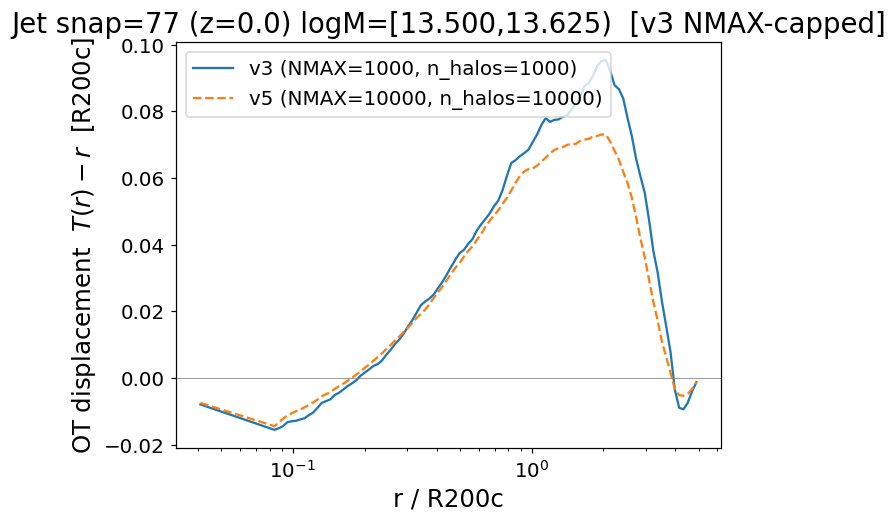

In [57]:
# compare the average OT map for one mass bin, v3 vs v5 (full load -- fine for one bin)
def plot_ot_compare(sim, snap, lo, hi=None):
    hi = hi if hi is not None else round(lo + 0.125, 3)
    b3 = load_bin(f3, snap, sim, lo, hi)
    b5 = load_bin(f5, snap, sim, lo, hi)
    if b3 is None or b5 is None:
        print(f"missing: v3={b3 is not None} v5={b5 is not None}"); return
    if b3["status"] != "ok" or b5["status"] != "ok":
        print(f"not ok: v3 status={b3['status']} v5 status={b5['status']}"); return

    capped = b3["n_halos"] == b3["nmax"]
    # 'ot' is the raw OT map T(r) (mapped radius), not the displacement -- the amplitude people
    # actually look at is T(r) - r, same convention as Func_for_fit.get_ot_map
    plt.plot(b3["rc"], b3["ot"] - b3["rc"], "-", label=f"v3 (NMAX=1000, n_halos={b3['n_halos']})")
    plt.plot(b5["rc"], b5["ot"] - b5["rc"], "--", label=f"v5 (NMAX=10000, n_halos={b5['n_halos']})")
    plt.xscale("log"); plt.axhline(0, color="gray", lw=.5)
    plt.xlabel("r / R200c"); plt.ylabel(r"OT displacement  $T(r) - r$  [R200c]")
    plt.legend()
    z = SNAP_Z.get(int(snap), np.nan)
    tag = "v3 NMAX-capped" if capped else "v3 uncapped -- same halo sample both sides"
    plt.title(f"{sim} snap={snap} (z={z}) logM=[{lo:.3f},{hi:.3f})  [{tag}]")
    plt.show()

plot_ot_compare("Jet", "77", 13.5)


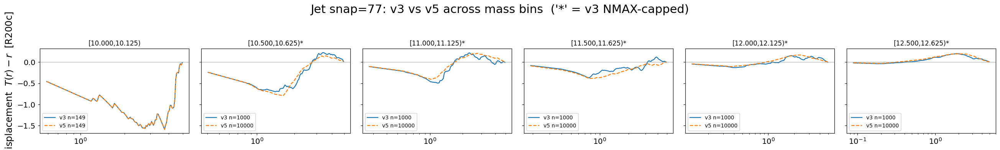

In [58]:
# same comparison across several neighboring mass bins at once (light load -- many bins)
# plots the OT amplitude T(r) - r (not the raw mapped radius T(r)) vs r/R200c
def plot_ot_compare_grid(sim, snap, los):
    fig, ax = plt.subplots(1, len(los), figsize=(4*len(los), 3.5), sharey=True)
    ax = np.atleast_1d(ax)
    for j, lo in enumerate(los):
        hi = round(lo + 0.125, 3)
        b3 = load_ot(f3, snap, sim, lo, hi); b5 = load_ot(f5, snap, sim, lo, hi)
        if b3 is None or b5 is None or b3["status"] != "ok" or b5["status"] != "ok":
            ax[j].set_title(f"[{lo:.3f},{hi:.3f}) -- missing/bad", fontsize=10); continue
        capped = b3["n_halos"] == b3["nmax"]
        ax[j].plot(b3["rc"], b3["ot"] - b3["rc"], "-", label=f"v3 n={b3['n_halos']}")
        ax[j].plot(b5["rc"], b5["ot"] - b5["rc"], "--", label=f"v5 n={b5['n_halos']}")
        ax[j].set_xscale("log"); ax[j].axhline(0, color="gray", lw=.5)
        ax[j].set_title(f"[{lo:.3f},{hi:.3f}){'*' if capped else ''}", fontsize=11)
        ax[j].legend(fontsize=9)
    ax[0].set_ylabel(r"OT displacement  $T(r) - r$  [R200c]")
    plt.suptitle(f"{sim} snap={snap}: v3 vs v5 across mass bins  ('*' = v3 NMAX-capped)", y=1.03)
    plt.tight_layout(); plt.show()

plot_ot_compare_grid("Jet", "77", [10.0, 10.5, 11.0, 11.5, 12.0, 12.5])


In [59]:
# convergence summary across every bin present in both files: how much does the average OT
# map actually move between NMAX=1000 and NMAX=10000, and is the movement concentrated in the
# bins where the v3 cap was actually binding (n_halos_v3 == 1000)? light load -- ~4100 bins.
rows = []
for snap in f5:
    for sim in f5[snap]:
        if sim not in f3.get(snap, {}):
            continue   # combo missing from v3 (69/Mstar-1sigma)
        for key in f5[snap][sim]:
            lo, hi = (float(x) for x in key.split("_"))
            b3 = load_ot(f3, snap, sim, lo, hi); b5 = load_ot(f5, snap, sim, lo, hi)
            if b3 is None or b5 is None or b3["status"] != "ok" or b5["status"] != "ok":
                continue
            diff = np.abs(b5["ot"] - b3["ot"])
            rows.append(dict(snap=snap, sim=sim, lo=lo, hi=hi,
                              capped=bool(b3["n_halos"] == b3["nmax"]),
                              n_halos_v3=int(b3["n_halos"]), n_halos_v5=int(b5["n_halos"]),
                              max_abs_diff=float(diff.max()),
                              rms_diff=float(np.sqrt((diff**2).mean()))))
diffs = pd.DataFrame(rows)
diffs.groupby("capped")[["max_abs_diff", "rms_diff"]].describe()


max_abs_diff                                                           \
              count    mean       std       min       25%       50%      75%   
capped                                                                         
False         949.0  0.0000  0.000000  0.000000  0.000000  0.000000  0.00000   
True         2849.0  0.1142  0.103738  0.000469  0.025868  0.089476  0.17247   

                 rms_diff                                                   \
             max    count      mean       std       min       25%      50%   
capped                                                                       
False   0.000000    949.0  0.000000  0.000000  0.000000  0.000000  0.00000   
True    0.790343   2849.0  0.053781  0.053637  0.000133  0.010674  0.03955   

                            
             75%       max  
capped                      
False   0.000000  0.000000  
True    0.079364  0.429233

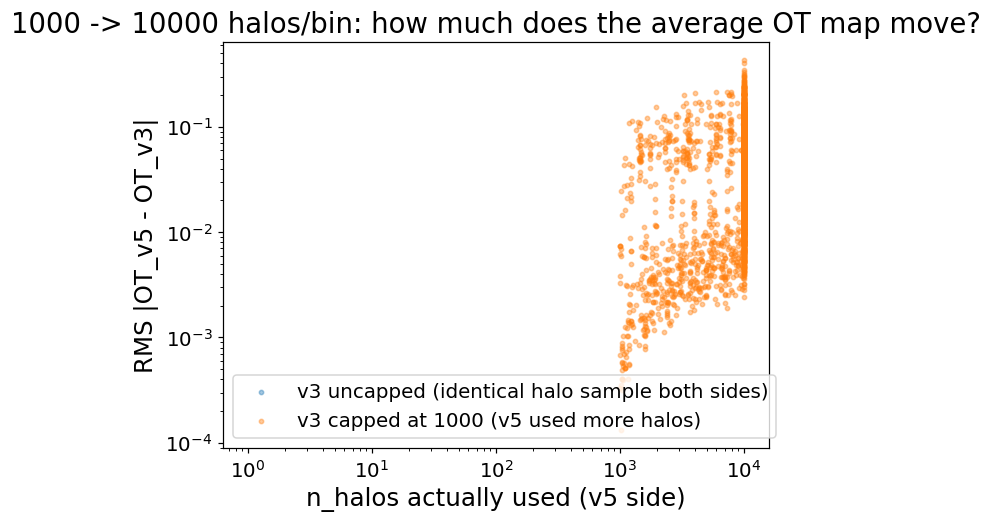

In [60]:
# does adding halos beyond 1000/bin actually change the average OT map?
plt.scatter(diffs.loc[~diffs.capped, "n_halos_v3"], diffs.loc[~diffs.capped, "rms_diff"],
            s=8, alpha=.4, label="v3 uncapped (identical halo sample both sides)")
plt.scatter(diffs.loc[diffs.capped, "n_halos_v5"], diffs.loc[diffs.capped, "rms_diff"],
            s=8, alpha=.4, label="v3 capped at 1000 (v5 used more halos)")
plt.xscale("log"); plt.yscale("log")
plt.xlabel("n_halos actually used (v5 side)"); plt.ylabel("RMS |OT_v5 - OT_v3|")
plt.legend()
plt.title("1000 -> 10000 halos/bin: how much does the average OT map move?")
plt.show()


# Model the OT amplitude in (log M, z)

Using `profiles_v5_10k.hdf5` only (NMAX=10000) from here on -- the "at least 10k halos" cut
below only makes sense against the 10k-cap file.

**Bin selection.** A bin is kept if `status == "ok"`, the pipeline's own `ot_reliable` flag is
`True` (only set once the map is resolved down to `r/R200c <~ 0.15` -- this is what makes it
safe to interpolate every kept curve onto a single common radial grid later, no extrapolation
needed), and:

- **low-mass bins** (below the mass where the NMAX=10000 cap stops binding, for that snap/sim)
  must have `n_halos >= 10000` -- below the cap there's no reason to accept a noisier bin.
- **high-mass bins** (above that point) are kept with `n_halos >= 100` -- a flat 10k floor is
  infeasible here (even z=0's top bin only reaches ~9600 halos), but a handful of these bins
  have as few as 2-3 halos and are pure shot noise, so a much lower absolute floor still guards
  against those. This is what actually drops snap 13 (z=4) entirely and trims snap 17 (z=3).

Then: (1) plot every kept OT amplitude curve per sim, colored by mass -- both faceted by
snapshot and overlaid in one panel; (2) fit one global 4-component PCA across all sims/z/mass,
and look at how the 4 coefficients vary with (log M, z) per sim -- the eventual model is a smooth
fit of those coefficients, not fit yet here.

In [61]:
import matplotlib as mpl

def peak_capped_mass(f, snap, sim, nmax=10000):
    """Highest logM lo-edge in this (snap, sim) where the bin still hit the halo cap --
    bins above this are 'high mass' (fewer than nmax halos is expected, not a quality problem)."""
    los = [f[snap][sim][k].attrs["lo"] for k in f[snap][sim]
           if f[snap][sim][k].attrs.get("status") == "ok"
           and f[snap][sim][k].attrs.get("n_halos") == nmax]
    return max(los) if los else -np.inf

def select_bins(f=f5, sims=SIMS, nmin_low_mass=10000, nmin_high_mass=100):
    """nmin_low_mass applies below the (snap, sim)-dependent mass where the NMAX cap stops
    binding; nmin_high_mass is a much lower absolute floor above it, just to drop the handful
    of high-mass bins with only a few halos (pure shot noise), not to demand full statistics."""
    rows = []
    for snap in f:
        z = SNAP_Z.get(int(snap))
        if z is None:
            continue
        for sim in sims:
            if sim not in f[snap]:
                continue
            peak = peak_capped_mass(f, snap, sim)
            for key in f[snap][sim]:
                g = f[snap][sim][key]
                if g.attrs.get("status") != "ok" or not g.attrs.get("ot_reliable", False):
                    continue
                lo, hi, n = g.attrs["lo"], g.attrs["hi"], g.attrs["n_halos"]
                if not (n >= nmin_low_mass or (lo > peak and n >= nmin_high_mass)):
                    continue
                rows.append(dict(
                    sim=sim, snap=snap, z=z, lo=float(lo), hi=float(hi), logM=float(lo + hi) / 2,
                    n_halos=int(n), capped=bool(n == g.attrs["nmax"]),
                    rc=g["rc"][...], ot_amp=g["ot"][...] - g["rc"][...],
                ))
    return rows

bins_ = select_bins()
meta_preview = pd.DataFrame(bins_)[["sim", "snap", "z", "logM", "n_halos", "capped"]]
print(f"{len(bins_)} bins pass the cut (of {n5} total in v5)")
meta_preview.groupby("sim").size()


1519 bins pass the cut (of 4160 total in v5)


sim
Jet                         187
Jet_fgas-4sigma             190
Mstar-1sigma                190
Mstar-1sigma_fgas-4sigma    191
fgas+2sigma                 190
fgas-2sigma                 190
fgas-4sigma                 191
fgas-8sigma                 190
dtype: int64

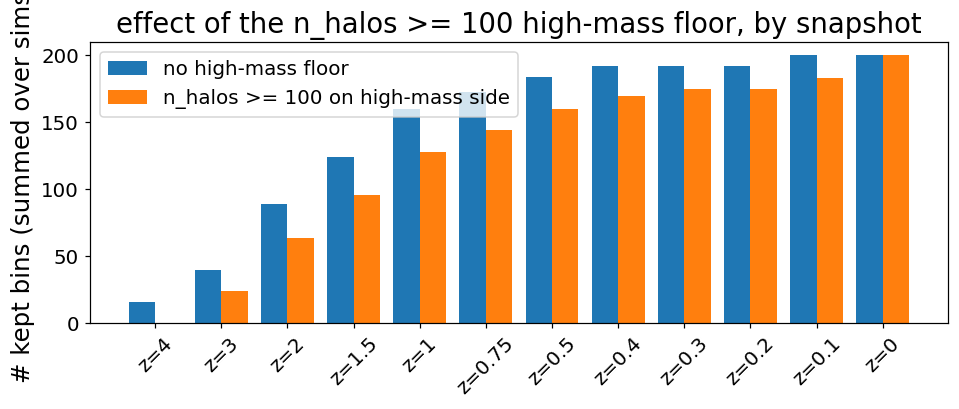

dropped 243 of 1762 bins (13.8%)


In [62]:
# quick check: what does the new n_halos>=100 floor on the high-mass side actually remove?
bins_nofloor = select_bins(nmin_high_mass=0)

snaps_sorted = sorted({b["snap"] for b in bins_nofloor}, key=lambda s: -SNAP_Z[int(s)])
before = [sum(1 for b in bins_nofloor if b["snap"] == s) for s in snaps_sorted]
after = [sum(1 for b in bins_ if b["snap"] == s) for s in snaps_sorted]

x = np.arange(len(snaps_sorted))
fig, ax = plt.subplots(figsize=(9, 4))
ax.bar(x - 0.2, before, width=0.4, label="no high-mass floor")
ax.bar(x + 0.2, after, width=0.4, label="n_halos >= 100 on high-mass side")
ax.set_xticks(x); ax.set_xticklabels([f"z={SNAP_Z[int(s)]:g}" for s in snaps_sorted], rotation=45)
ax.set_ylabel("# kept bins (summed over sims)")
ax.legend(); ax.set_title("effect of the n_halos >= 100 high-mass floor, by snapshot")
plt.tight_layout(); plt.show()

print(f"dropped {len(bins_nofloor) - len(bins_)} of {len(bins_nofloor)} bins "
      f"({100*(len(bins_nofloor)-len(bins_))/len(bins_nofloor):.1f}%)")
del bins_nofloor


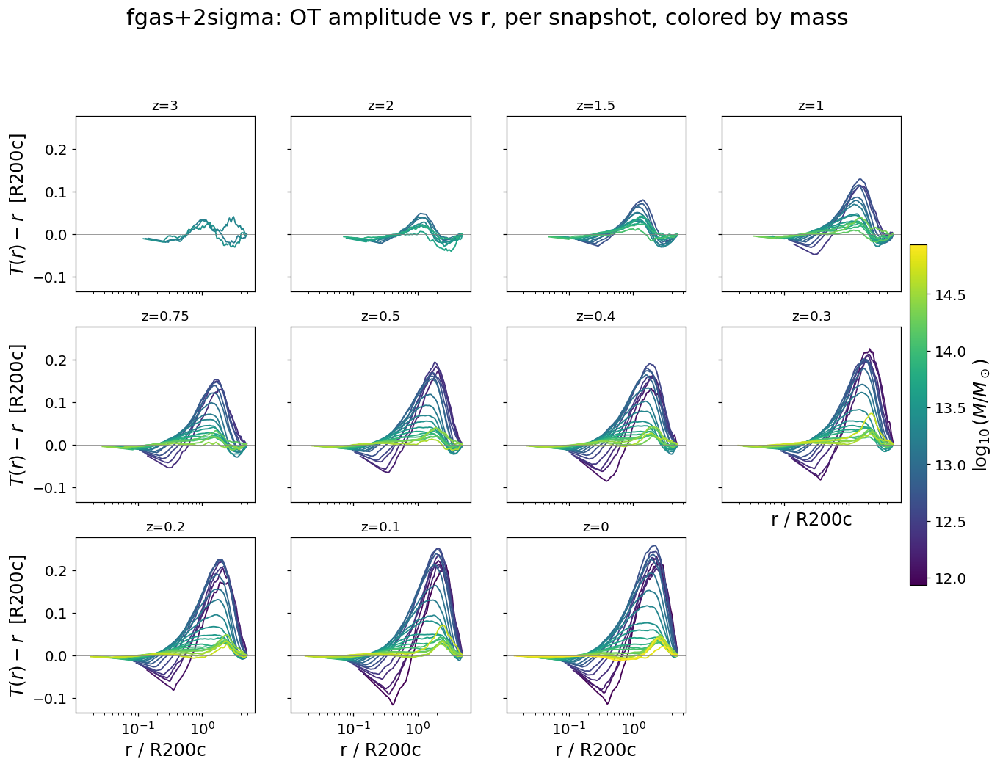

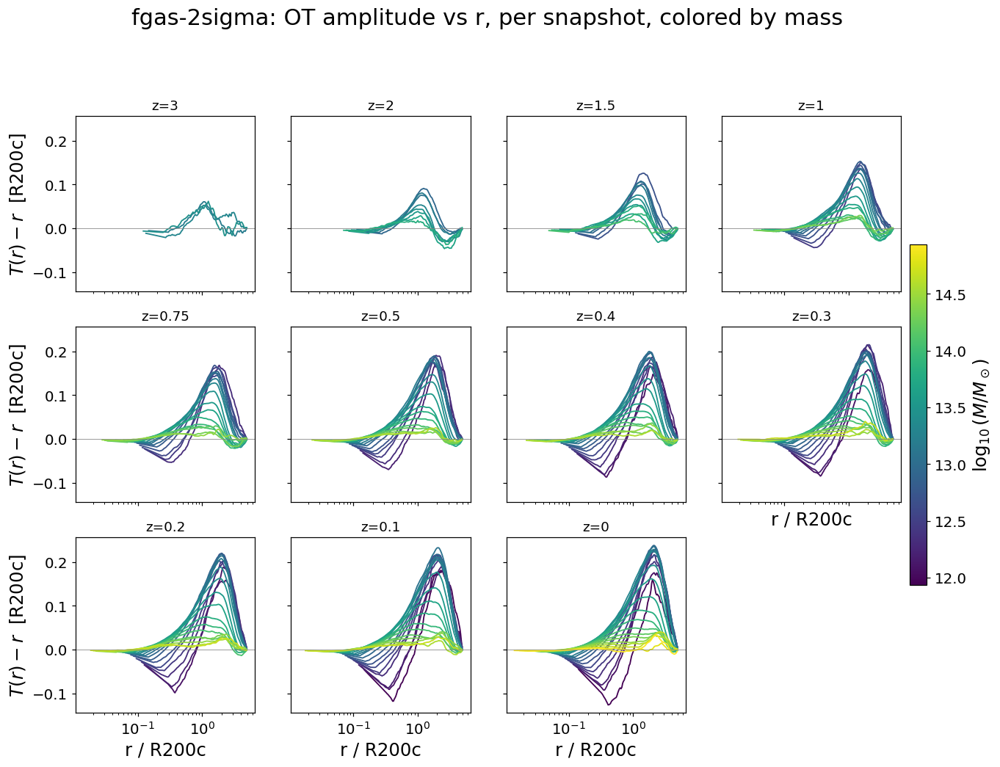

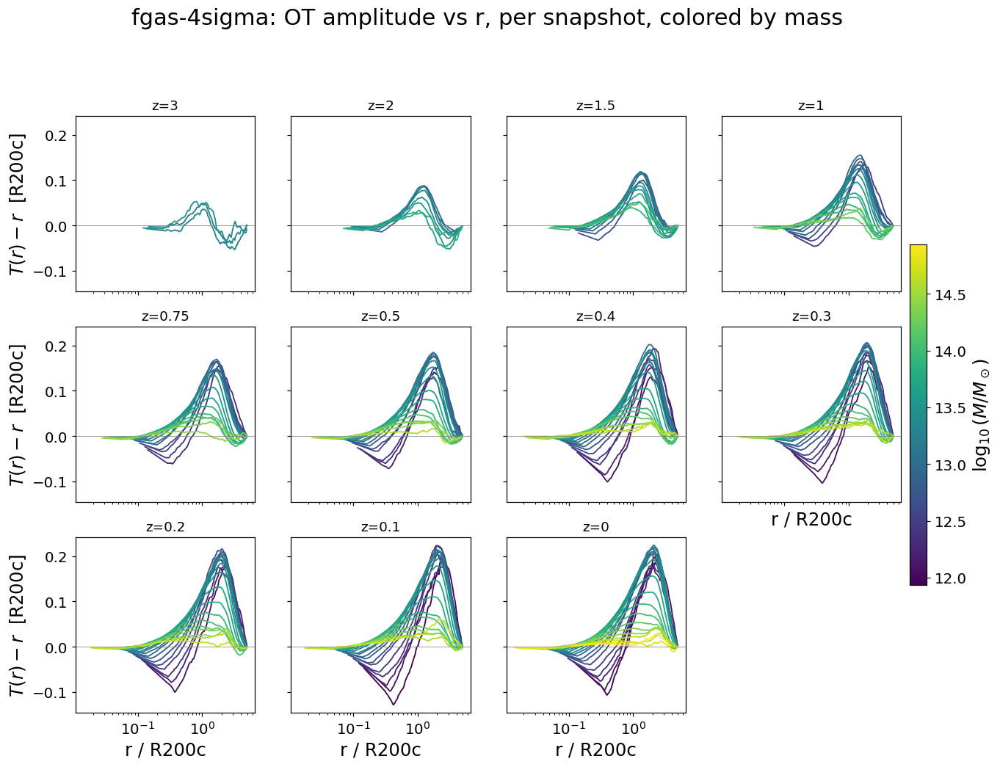

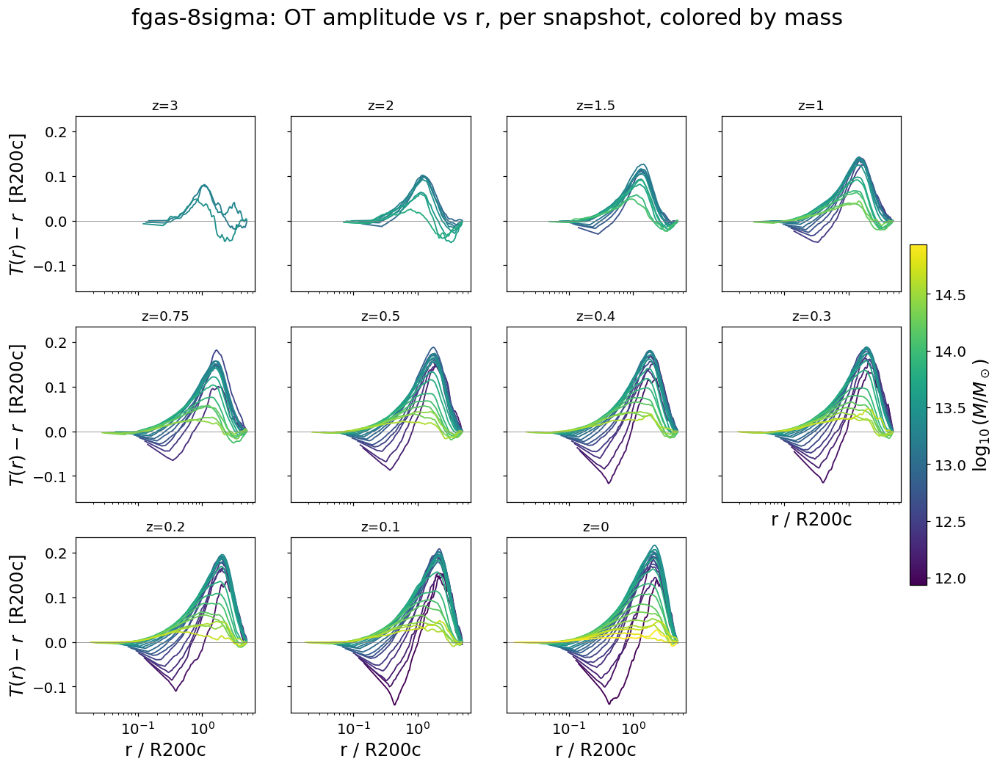

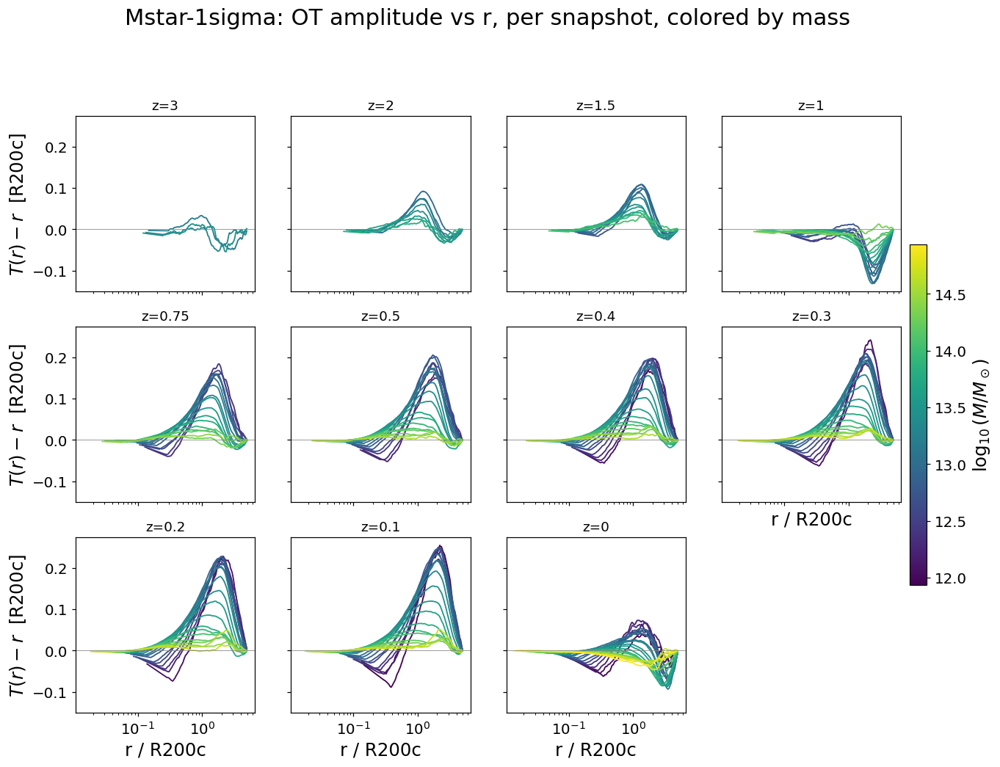

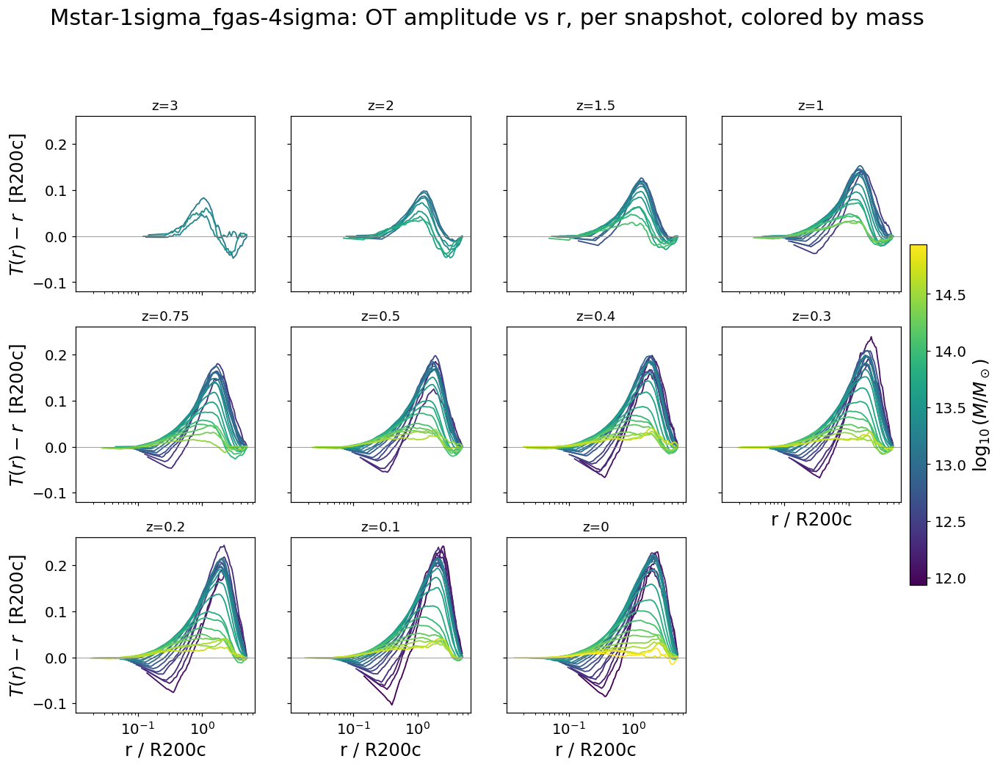

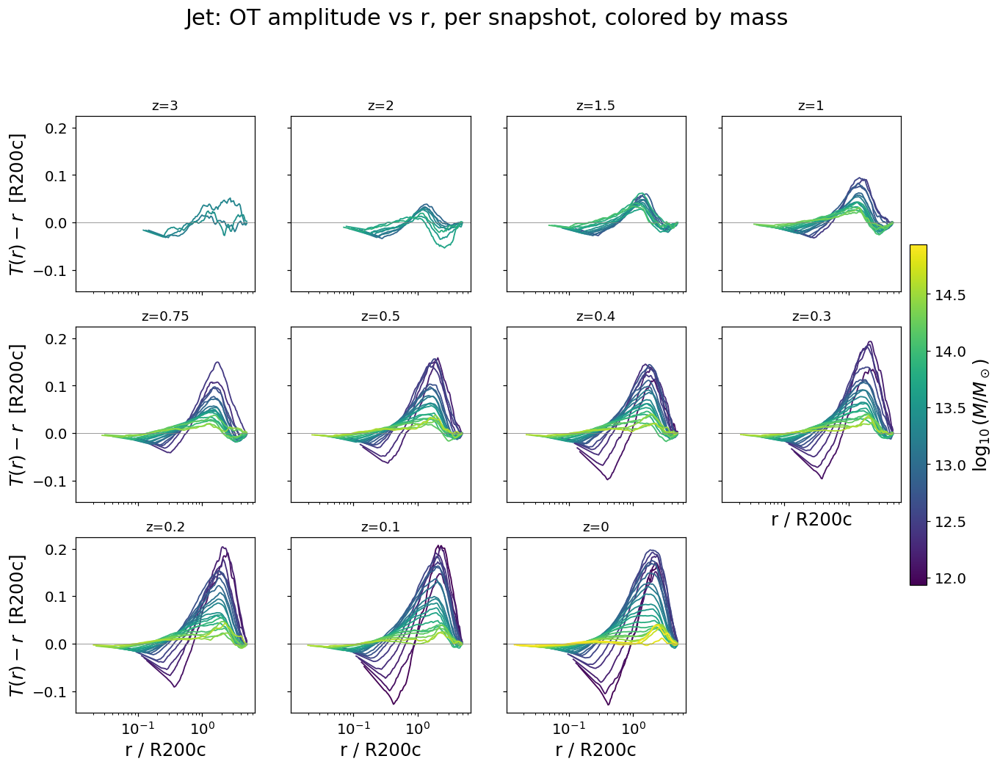

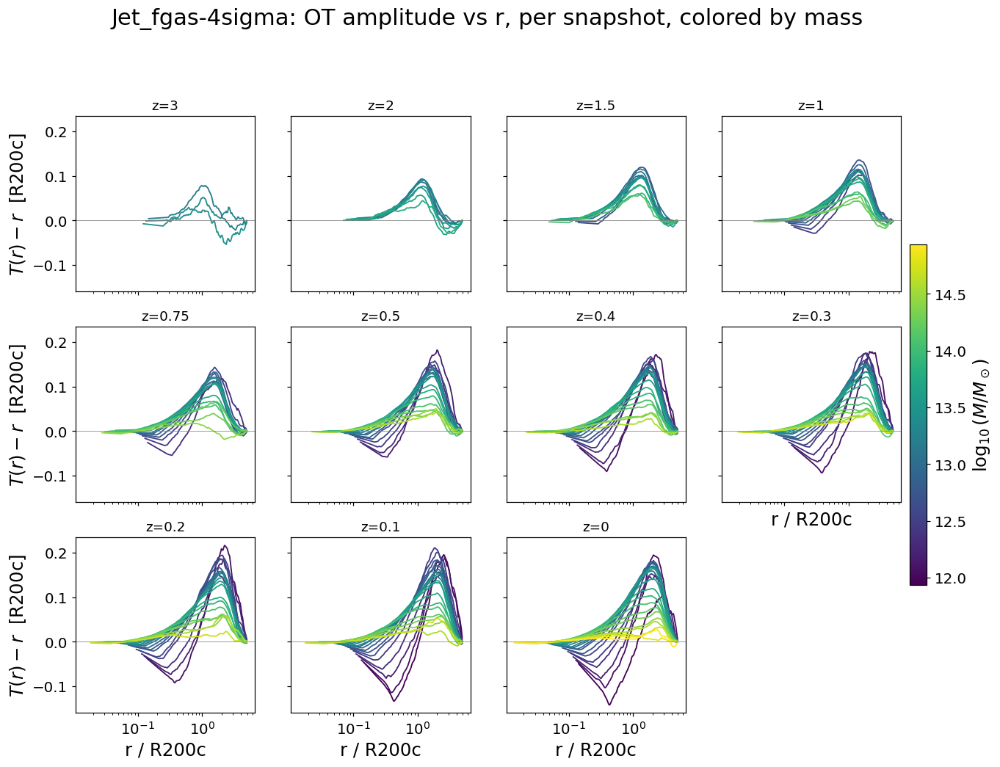

In [63]:
# per sim: one panel per snapshot, mass bins colored by logM (wrapped to a fixed ncols)
def plot_sim_grid_by_snap(sim, bins_=bins_, ncols=4):
    snaps = sorted({b["snap"] for b in bins_ if b["sim"] == sim}, key=lambda s: -SNAP_Z[int(s)])
    if not snaps:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in bins_ if b["sim"] == sim]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    nrows = int(np.ceil(len(snaps) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.4*ncols, 3.2*nrows), sharex=True, sharey=True)
    axes = np.atleast_1d(axes).ravel()
    for ax, snap in zip(axes, snaps):
        rows = [b for b in bins_ if b["sim"] == sim and b["snap"] == snap]
        for b in sorted(rows, key=lambda b: b["logM"]):
            ax.plot(b["rc"], b["ot_amp"], color=cmap(norm(b["logM"])), lw=1.2)
        ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
        ax.set_title(f"z={SNAP_Z[int(snap)]:g}", fontsize=12)
    for ax in axes[len(snaps):]:
        ax.axis("off")
    for ax in axes[max(0, len(snaps)-ncols):len(snaps)]:
        ax.set_xlabel("r / R200c")
    for ax in axes[0:len(snaps):ncols]:
        ax.set_ylabel(r"$T(r)-r$  [R200c]")

    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=axes[:len(snaps)], pad=0.01, fraction=0.02, label=r"$\log_{10}(M/M_\odot)$")
    fig.suptitle(f"{sim}: OT amplitude vs r, per snapshot, colored by mass", y=1.02)
    plt.show()

for sim in SIMS:
    plot_sim_grid_by_snap(sim)


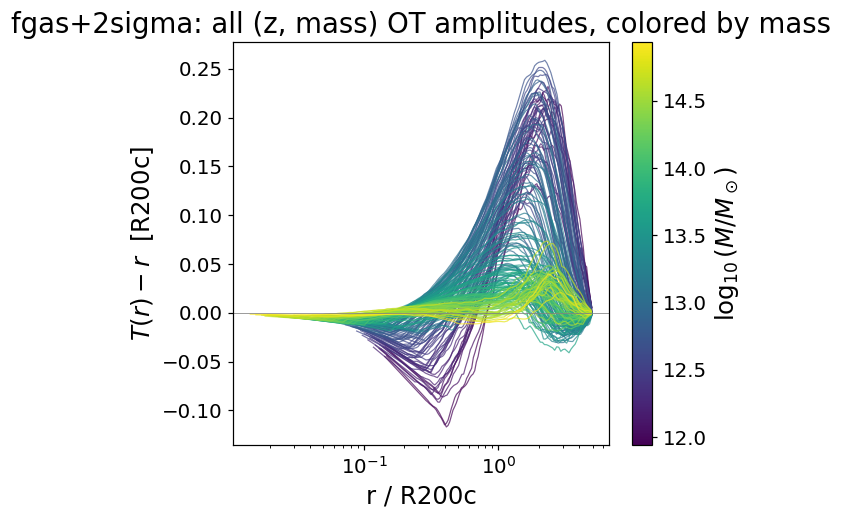

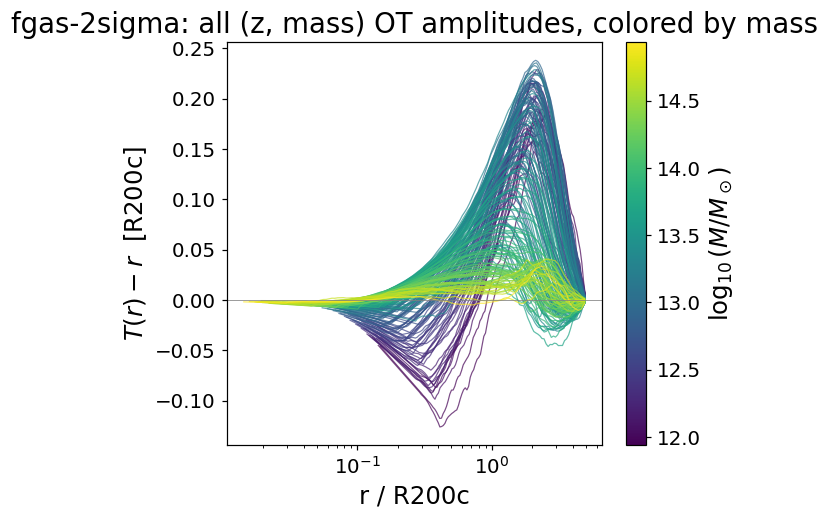

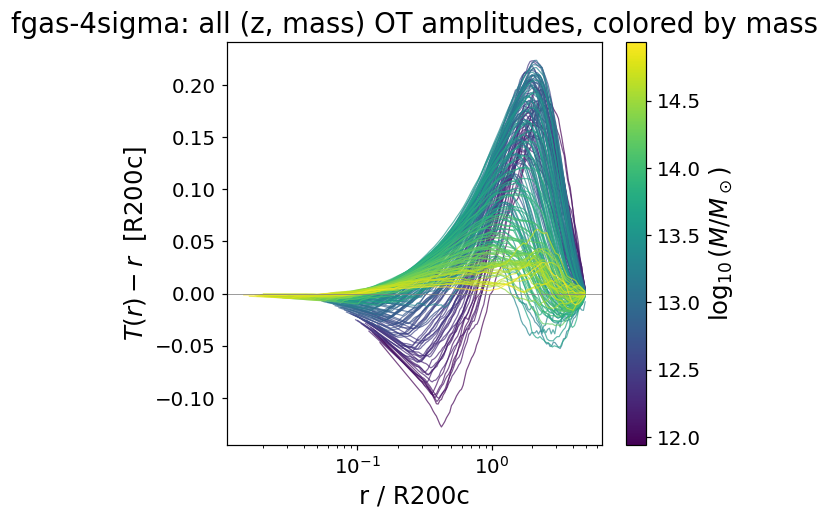

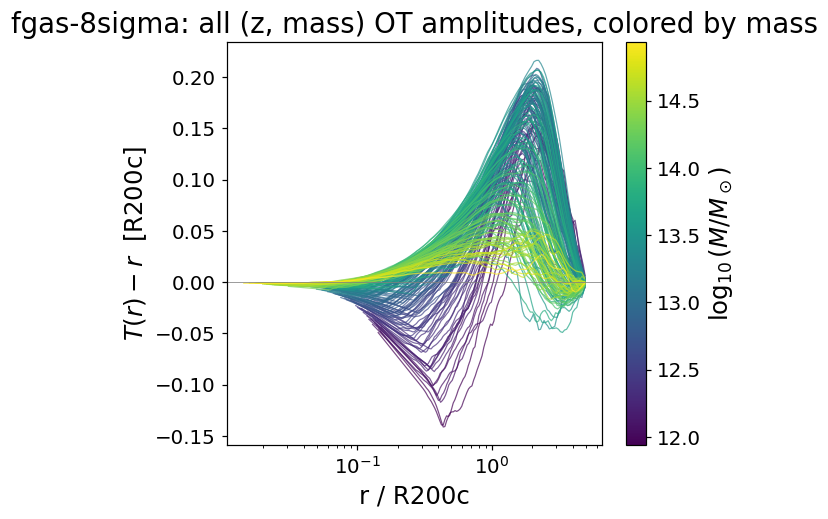

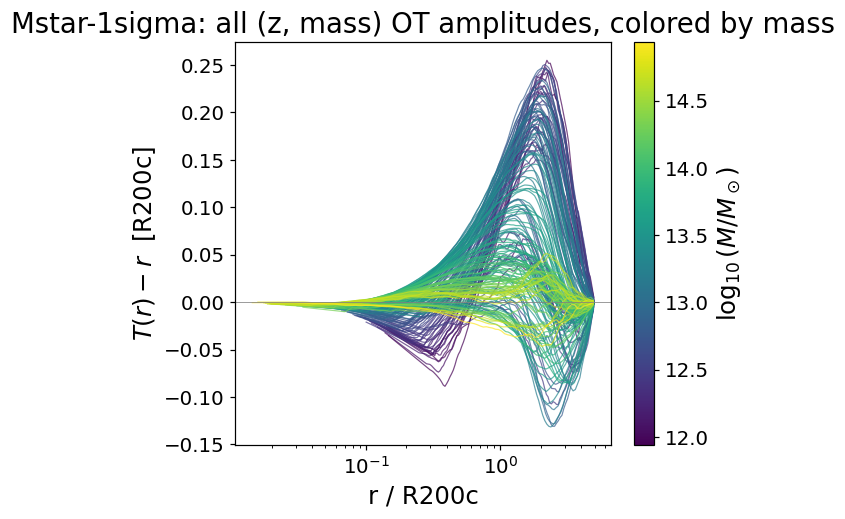

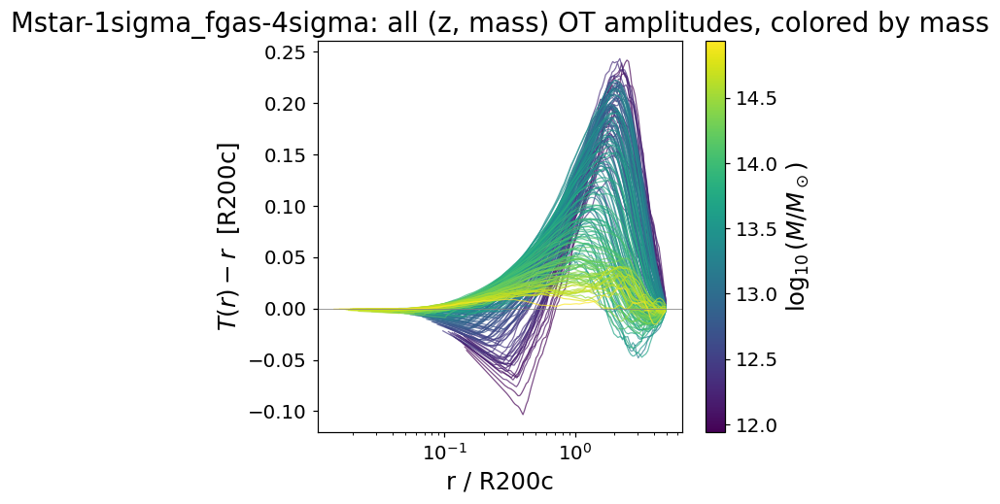

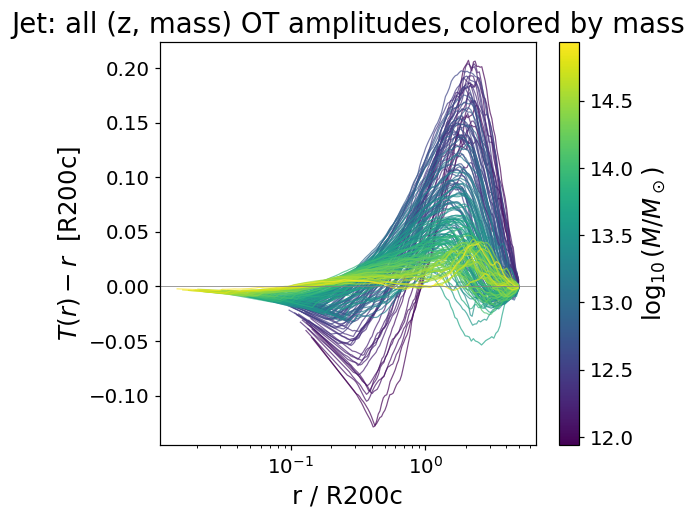

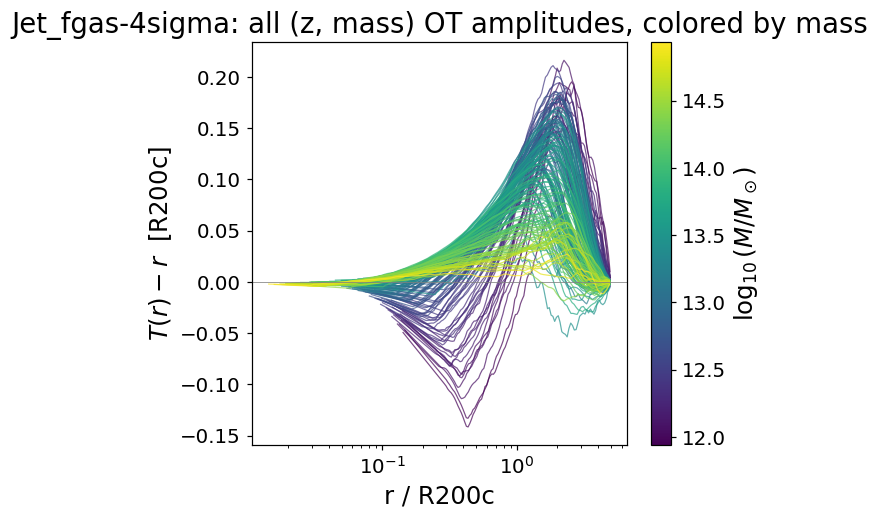

In [64]:
# per sim: single panel, every (z, mass) curve overlaid, colored by mass only
def plot_sim_overlay(sim, bins_=bins_):
    rows = [b for b in bins_ if b["sim"] == sim]
    if not rows:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in rows]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    fig, ax = plt.subplots(figsize=(6, 5))
    for b in sorted(rows, key=lambda b: b["logM"]):
        ax.plot(b["rc"], b["ot_amp"], color=cmap(norm(b["logM"])), lw=0.8, alpha=.7)
    ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
    ax.set_xlabel("r / R200c"); ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=ax, label=r"$\log_{10}(M/M_\odot)$")
    ax.set_title(f"{sim}: all (z, mass) OT amplitudes, colored by mass")
    plt.tight_layout(); plt.show()

for sim in SIMS:
    plot_sim_overlay(sim)


## PCA of the OT amplitude, 4 components, fit globally across all sims

Each kept bin has its own native `rc` grid (inner cutoff set by particle resolution -- it
shifts with mass and z), so curves aren't directly comparable feature-by-feature. Since the
`ot_reliable` cut already guarantees every kept curve is resolved over at least
`r/R200c in [0.15, 4.85]`, that range is used as a common grid: each curve is linearly
interpolated in `log(r)` onto it (no extrapolation needed), then all sims/z/mass are stacked
into one matrix and a single 4-component PCA is fit -- one universal shape basis, with the
sim/z/mass dependence living entirely in the 4 coefficients per bin.

In [65]:
from sklearn.decomposition import PCA

R_GRID = np.geomspace(0.15, 4.85, 100)   # inside every kept curve's own [rc[0], rc[-1]] range

def to_common_grid(b, r_grid=R_GRID):
    return np.interp(np.log(r_grid), np.log(b["rc"]), b["ot_amp"])

X = np.array([to_common_grid(b) for b in bins_])
meta = pd.DataFrame(bins_)[["sim", "snap", "z", "logM", "n_halos", "capped"]]

pca = PCA(n_components=4)
coeffs = pca.fit_transform(X)
for i in range(4):
    meta[f"pc{i+1}"] = coeffs[:, i]

print("explained variance ratio:", np.round(pca.explained_variance_ratio_, 4))
print("cumulative:", pca.explained_variance_ratio_.cumsum()[-1])
meta.head()


explained variance ratio: [0.754  0.2003 0.036  0.0041]
cumulative: 0.9943110348215873


,sim,snap,z,logM,n_halos,capped,pc1,pc2,pc3,pc4
0,fgas+2sigma,17,3.0,13.1875,800,False,-0.467138,-0.135629,-0.065223,-0.042111
1,fgas+2sigma,17,3.0,13.3125,294,False,-0.355935,-0.206239,0.050500,-0.092893
2,fgas+2sigma,17,3.0,13.4375,145,False,-0.521929,-0.124494,-0.062193,-0.037076
3,fgas-2sigma,17,3.0,13.1875,792,False,-0.376162,-0.030505,-0.070409,-0.058905
4,fgas-2sigma,17,3.0,13.3125,288,False,-0.276185,-0.153087,0.004393,-0.087450


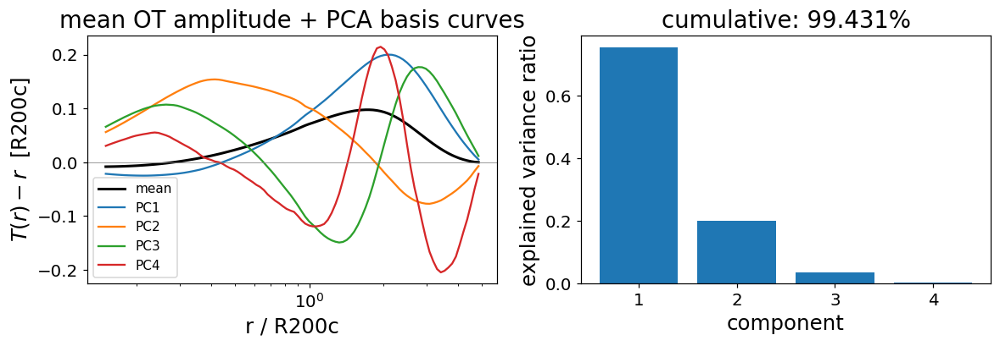

In [66]:
# the 4 basis curves themselves, + how much variance each explains
fig, axes = plt.subplots(1, 2, figsize=(11, 4))
axes[0].plot(R_GRID, pca.mean_, "k-", lw=2, label="mean")
for i in range(4):
    axes[0].plot(R_GRID, pca.components_[i], lw=1.5, label=f"PC{i+1}")
axes[0].set_xscale("log"); axes[0].axhline(0, color="gray", lw=.5)
axes[0].set_xlabel("r / R200c"); axes[0].set_ylabel(r"$T(r)-r$  [R200c]")
axes[0].legend(fontsize=10); axes[0].set_title("mean OT amplitude + PCA basis curves")

axes[1].bar(range(1, 5), pca.explained_variance_ratio_)
axes[1].set_xticks(range(1, 5)); axes[1].set_xlabel("component"); axes[1].set_ylabel("explained variance ratio")
axes[1].set_title(f"cumulative: {pca.explained_variance_ratio_.cumsum()[-1]:.3%}")
plt.tight_layout(); plt.show()


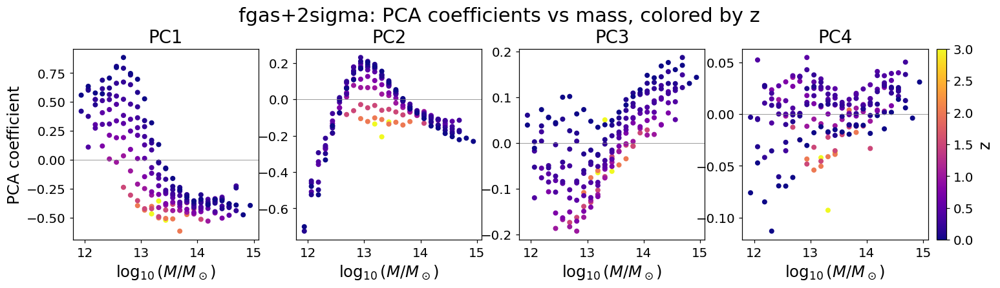

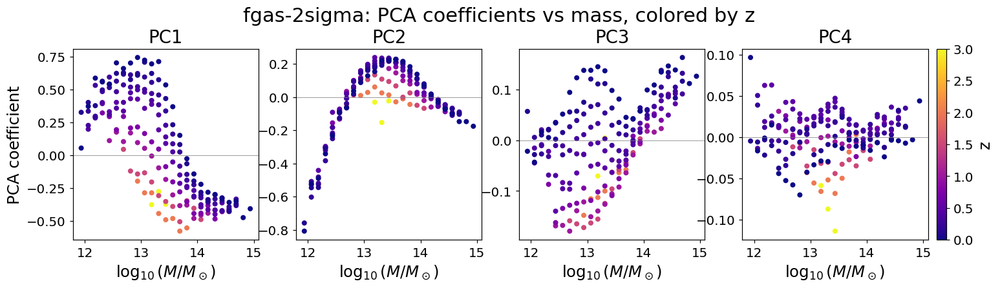

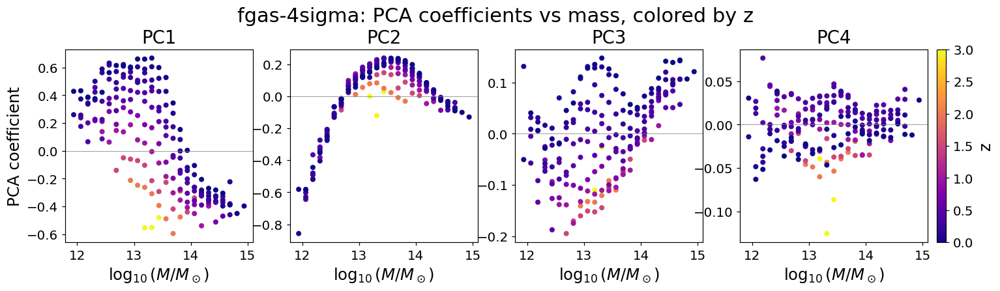

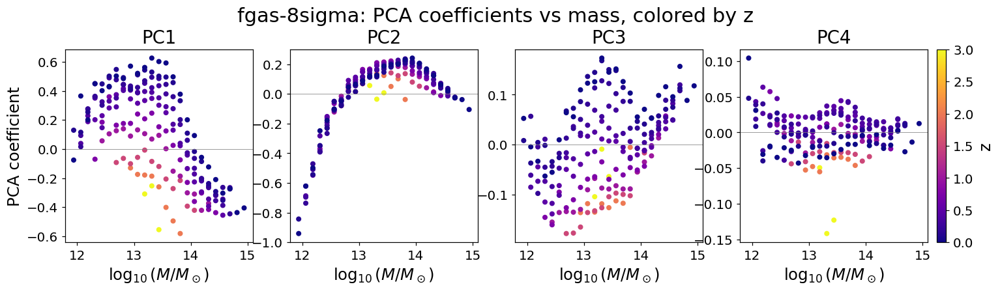

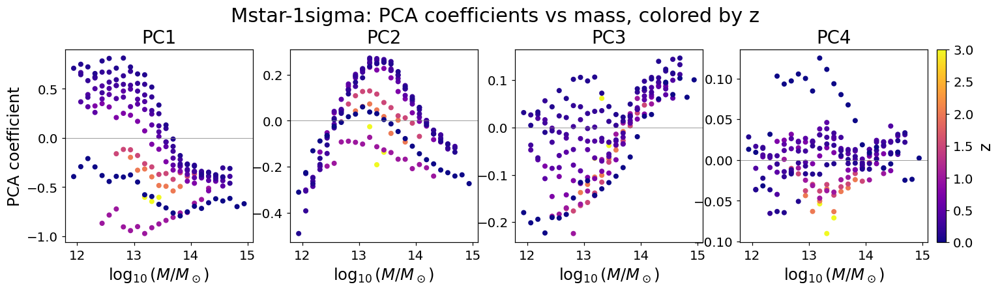

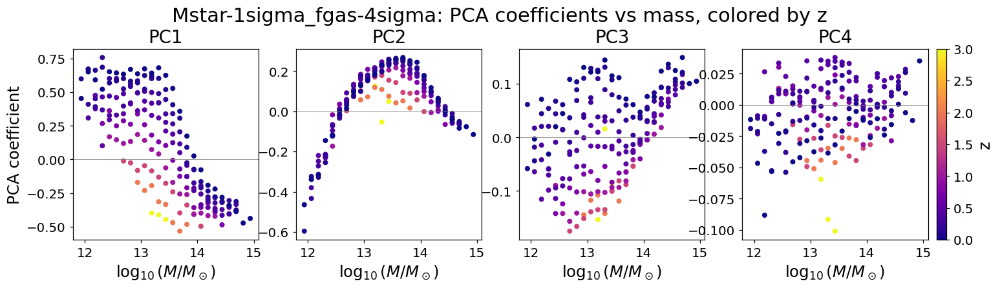

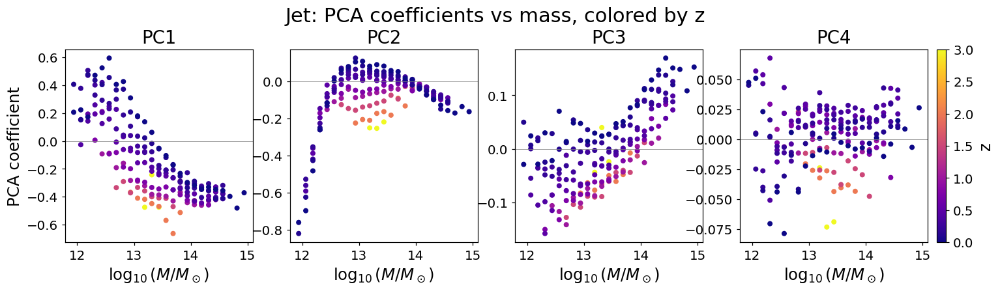

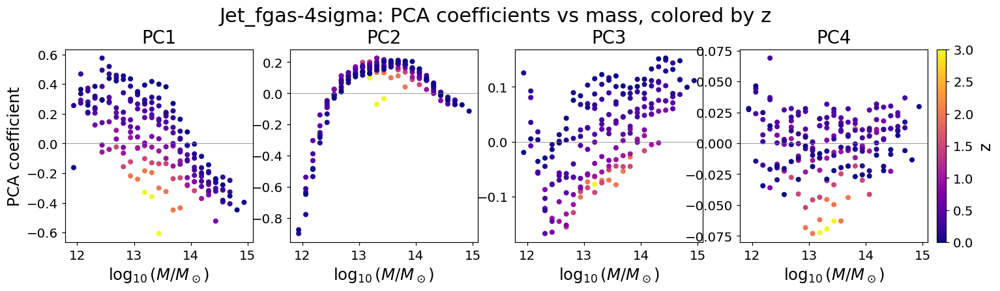

In [67]:
# per sim: how each of the 4 PCA coefficients varies with mass, colored by z --
# this is the (m, z) dependence a smooth model would need to fit next
def plot_pca_vs_mz(sim, meta=meta):
    sub = meta[meta.sim == sim]
    if sub.empty:
        print(f"no bins for {sim}"); return
    norm = mpl.colors.Normalize(vmin=sub.z.min(), vmax=sub.z.max())
    cmap = mpl.cm.plasma
    fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), sharex=True)
    for i, ax in enumerate(axes):
        sc = ax.scatter(sub.logM, sub[f"pc{i+1}"], c=sub.z, cmap=cmap, norm=norm, s=18)
        ax.set_xlabel(r"$\log_{10}(M/M_\odot)$"); ax.set_title(f"PC{i+1}")
        ax.axhline(0, color="gray", lw=.5)
    axes[0].set_ylabel("PCA coefficient")
    fig.colorbar(sc, ax=axes, pad=.01, fraction=.02, label="z")
    fig.suptitle(f"{sim}: PCA coefficients vs mass, colored by z", y=1.05)
    plt.show()

for sim in SIMS:
    plot_pca_vs_mz(sim)


## 14-parameter analytic model, per sim

Picked from the shape comparisons above. PC1: sigmoid clearly beats Gaussian across all 8 sims.
PC3 is linear. PC4 is dropped -- its within-sim mean is 5-10x smaller than its scatter, and
it's only 0.4% of total variance in every sim, so nothing buys it back.

**PC2, take 3.** A quadratic was a poor match (PC2 has a steep rise then a long asymmetric
tail). A difference-of-two-sigmoids matched the shape (R2 0.66-0.96) but the fit was unstable:
with a single fixed initial guess it actually *lost* to the quadratic on 2/8 sims, only
recovering with 10 random restarts -- the two sigmoids' amplitudes/widths trade off against
each other, so the optimizer gets stuck on a degenerate ridge. Fixed by splitting PC2 into two
functionally distinct pieces instead of two competing sigmoids: a **sigmoid baseline** (sets
the two different plateau levels before/after the transition) plus a **Gaussian bump** on top
(the overshoot right at the transition), with its own independent pivot mass -- tying it to
PC1's pivot was tried and made the fit much worse, so PC2 genuinely transitions at a different
mass than PC1. Same parameter count, but a single sensible initial guess now lands within 0.01
of the 10-restart best on every sim checked -- no restart logic needed.

- `PC1(logM, z) = A * tanh[(M0(z) - logM) / w]`, `M0(z) = m0 + m1*z`  -- 4 params (A, w, m0, m1)
- `PC2(logM, z) = L_lo + (L_hi-L_lo)/2 * (1 + tanh[(logM-M2(z))/w0]) + H * exp(-[(logM-M2(z))/wp]^2)`,
  `M2(z) = m0_2 + m1_2*z`  -- 7 params (m0_2, m1_2, L_lo, L_hi, w0, H, wp)
- `PC3(logM, z) = c0 + c1*(logM-13.5) + c2*z`  -- 3 params, plain least squares
- `PC4 = 0`

Total: **14 params/sim**. R2 for PC2 with this form (single-guess fit, no restarts): 0.66-0.95
across the 8 sims, matching or beating the double-sigmoid's restart-optimum everywhere.
`Mstar-1sigma` still caps at R2~0.665 for PC2 (and 0.52 for PC1) no matter the functional form
or how many restarts -- confirmed that's a real property of that sim's data, not a fitting
artifact, and worth a separate look (see `plot_bin_examples` below).

In [ ]:
from scipy.optimize import curve_fit

M_REF = 13.5

def pc1_fun(X, A, w, m0, m1):
    logM, z = X
    return A * np.tanh(((m0 + m1 * z) - logM) / w)

def pc2_fun(X, m0, m1, L_lo, L_hi, w0, H, wp):
    logM, z = X
    M2 = m0 + m1 * z
    baseline = L_lo + (L_hi - L_lo) / 2 * (1 + np.tanh((logM - M2) / w0))
    bump = H * np.exp(-((logM - M2) / wp) ** 2)
    return baseline + bump

def fit_pc3(logM, z, y):
    m = logM - M_REF
    D = np.column_stack([np.ones_like(m), m, z])
    coef, *_ = np.linalg.lstsq(D, y, rcond=None)
    return coef

def pc3_fun(logM, z, coef):
    m = logM - M_REF
    c0, c1, c2 = coef
    return c0 + c1 * m + c2 * z

def fit_sim(sim, meta=meta):
    sub = meta[meta.sim == sim]
    logM, z = sub.logM.values, sub.z.values
    y1, y2, y3 = sub.pc1.values, sub.pc2.values, sub.pc3.values

    A0 = (y1.max() - y1.min()) / 2
    p0_1 = [A0, 1.0, np.median(logM), -0.3]
    bounds_1 = ([-3, 0.02, 8, -5], [3, 10, 18, 5])
    popt1, _ = curve_fit(pc1_fun, (logM, z), y1, p0=p0_1, bounds=bounds_1, maxfev=50000)

    p0_2 = [np.median(logM), -0.3, y2.min(), 0.0, 0.5, y2.max() - y2.min(), 0.5]
    bounds_2 = ([8, -5, -3, -3, 0.05, -3, 0.05], [18, 5, 3, 3, 10, 3, 10])
    popt2, _ = curve_fit(pc2_fun, (logM, z), y2, p0=p0_2, bounds=bounds_2, maxfev=50000)

    return dict(popt1=popt1, popt2=popt2, popt3=fit_pc3(logM, z, y3))

fits = {sim: fit_sim(sim) for sim in SIMS}

def predict_pcs(sim, logM, z):
    logM, z = np.atleast_1d(logM), np.atleast_1d(z)
    p1, p2, p3 = fits[sim]["popt1"], fits[sim]["popt2"], fits[sim]["popt3"]
    pc1 = pc1_fun((logM, z), *p1)
    pc2 = pc2_fun((logM, z), *p2)
    pc3 = pc3_fun(logM, z, p3)
    return np.stack([pc1, pc2, pc3, np.zeros_like(pc1)], axis=1)

def predict_curve(sim, logM, z):
    return pca.inverse_transform(predict_pcs(sim, logM, z))[0]

# fit quality summary: per-PC R^2 and the fraction of actual OT-curve shape variance recovered
rows = []
for sim in SIMS:
    sub = meta[meta.sim == sim]
    pcs_pred = predict_pcs(sim, sub.logM.values, sub.z.values)
    pcs_true = sub[["pc1", "pc2", "pc3", "pc4"]].values
    X_true = X[meta.sim.values == sim]
    X_pred = pca.inverse_transform(pcs_pred)
    frac_var = 1 - np.sum((X_pred - X_true) ** 2) / np.sum((X_true - X_true.mean(axis=0)) ** 2)
    r2 = [1 - np.sum((pcs_true[:, i] - pcs_pred[:, i]) ** 2) / np.sum((pcs_true[:, i] - pcs_true[:, i].mean()) ** 2)
          for i in range(3)]
    rows.append(dict(sim=sim, r2_pc1=r2[0], r2_pc2=r2[1], r2_pc3=r2[2], frac_shape_var=frac_var))
pd.DataFrame(rows).round(3)


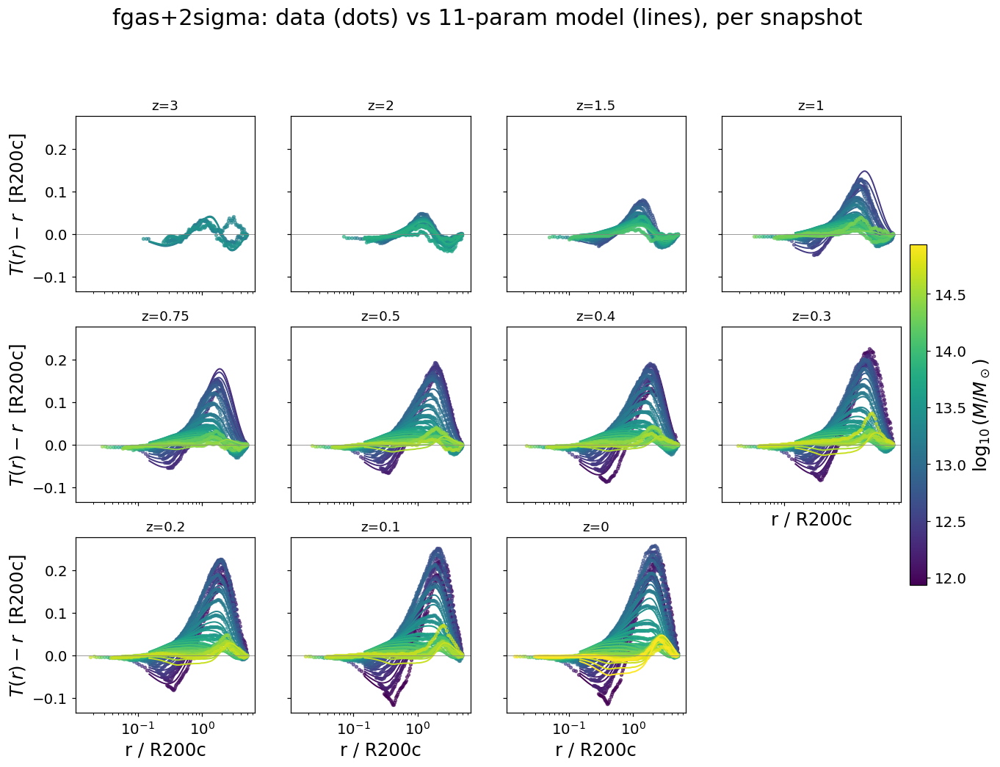

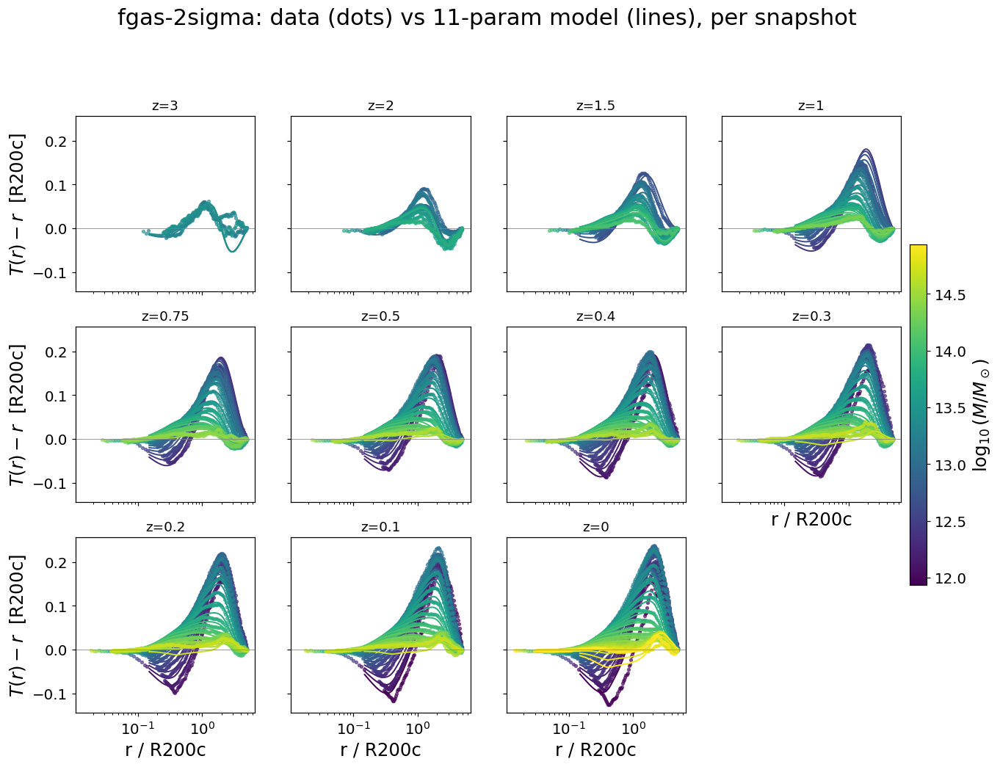

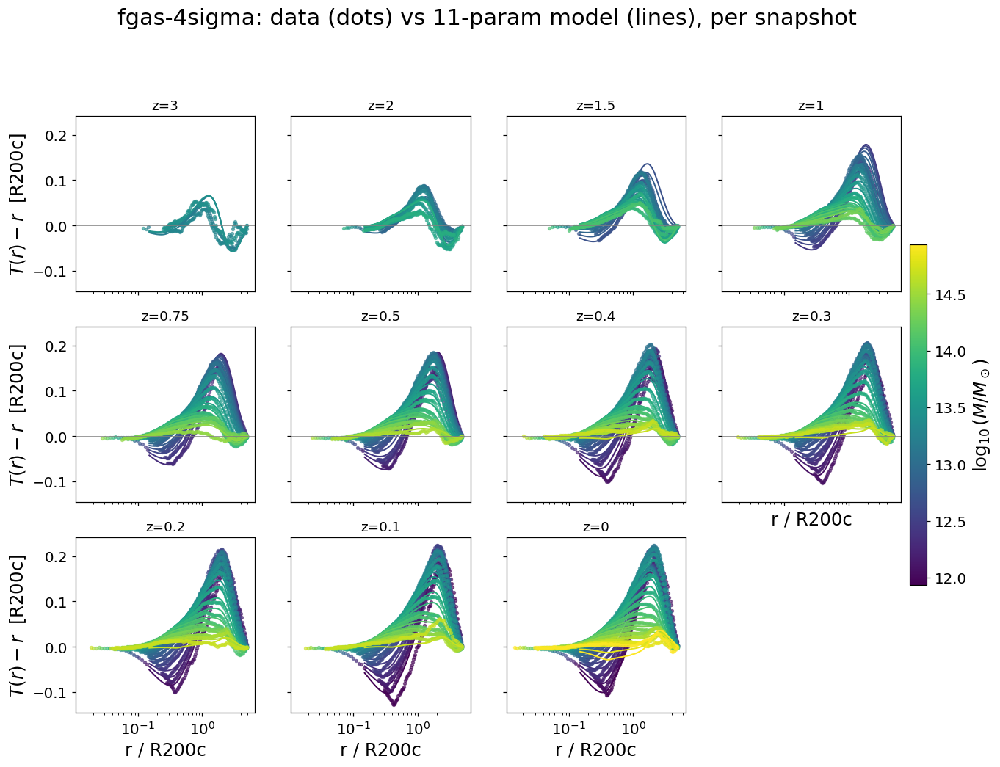

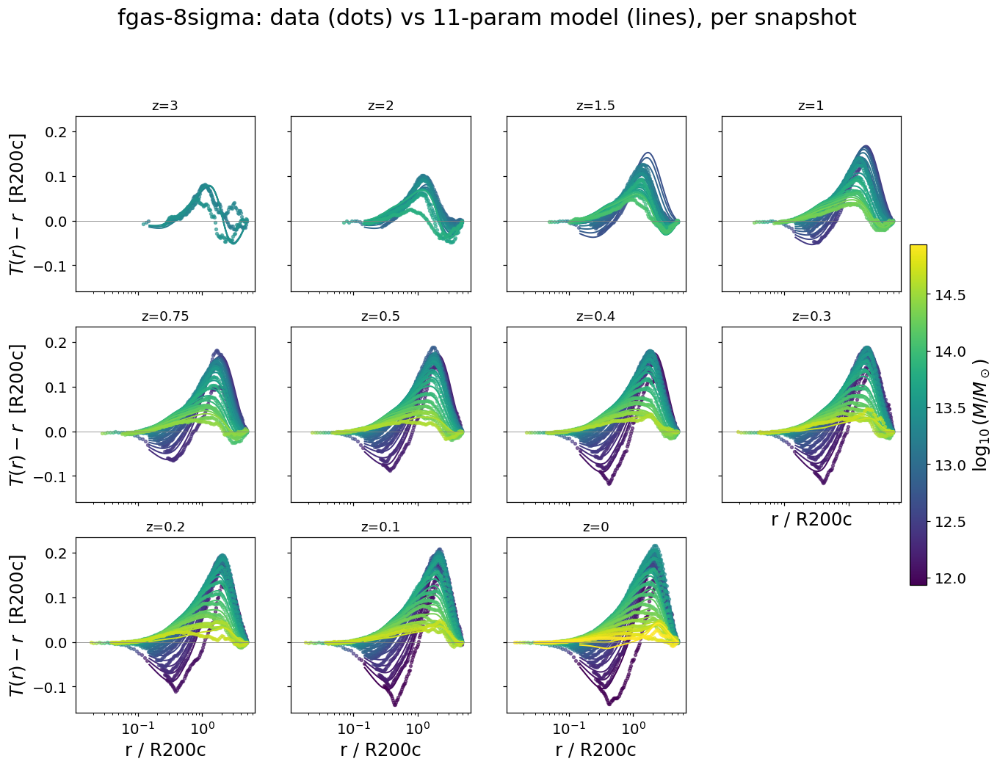

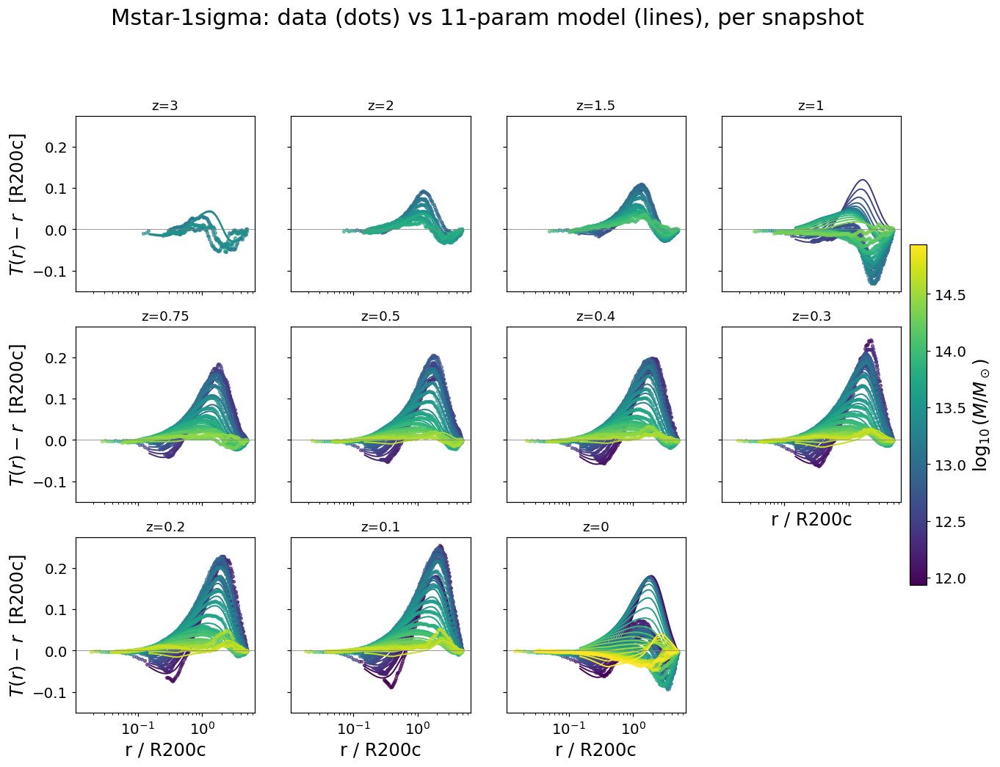

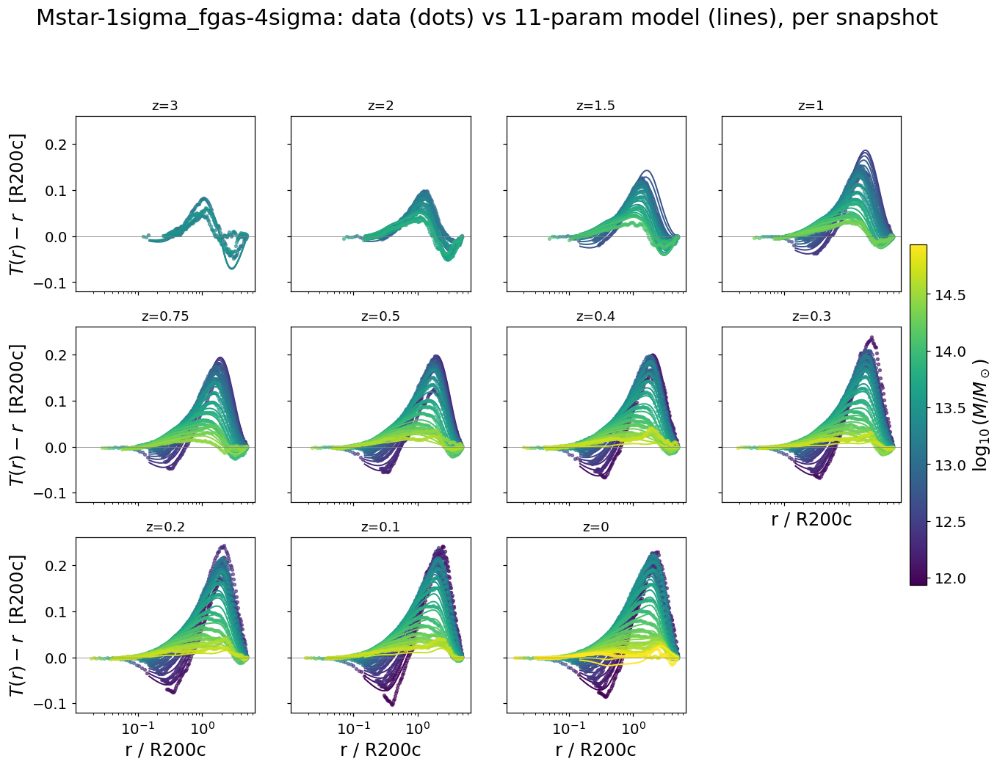

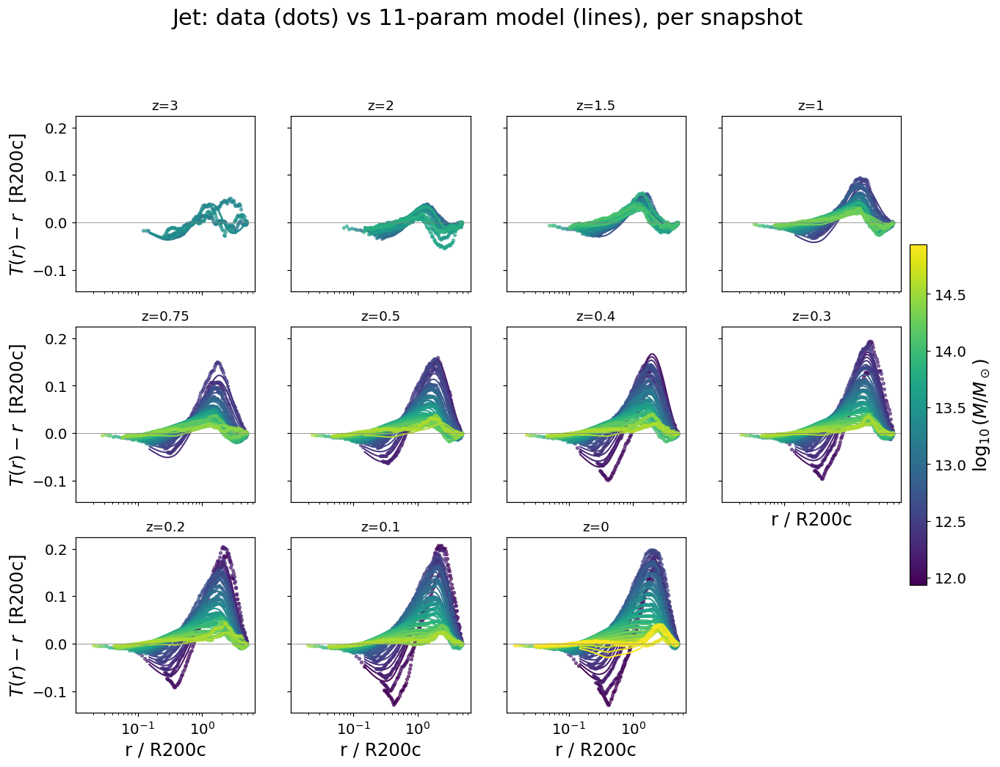

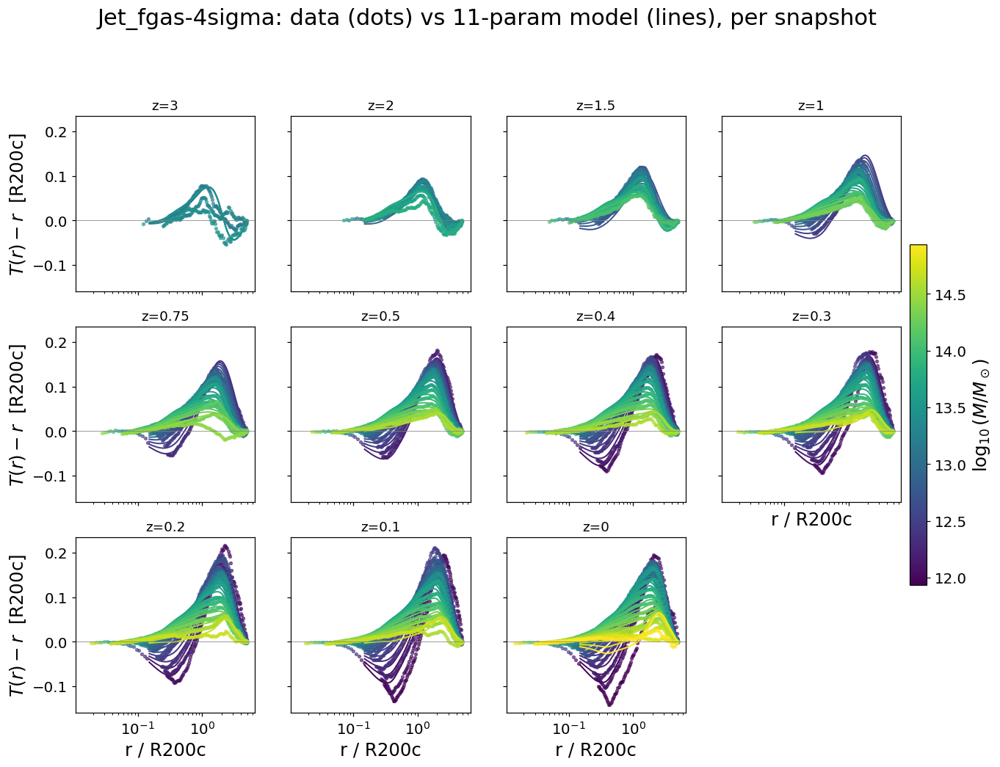

In [69]:
# per sim, per snapshot: data (dots) vs 11-param model reconstruction (lines), colored by mass
def plot_sim_grid_fit(sim, bins_=bins_, ncols=4):
    snaps = sorted({b["snap"] for b in bins_ if b["sim"] == sim}, key=lambda s: -SNAP_Z[int(s)])
    if not snaps:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in bins_ if b["sim"] == sim]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    nrows = int(np.ceil(len(snaps) / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.4*ncols, 3.2*nrows), sharex=True, sharey=True)
    axes = np.atleast_1d(axes).ravel()
    for ax, snap in zip(axes, snaps):
        rows = [b for b in bins_ if b["sim"] == sim and b["snap"] == snap]
        for b in sorted(rows, key=lambda b: b["logM"]):
            color = cmap(norm(b["logM"]))
            ax.plot(b["rc"], b["ot_amp"], "o", color=color, ms=2.5, alpha=.6)
            ax.plot(R_GRID, predict_curve(sim, b["logM"], b["z"]), "-", color=color, lw=1.3)
        ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
        ax.set_title(f"z={SNAP_Z[int(snap)]:g}", fontsize=12)
    for ax in axes[len(snaps):]:
        ax.axis("off")
    for ax in axes[max(0, len(snaps)-ncols):len(snaps)]:
        ax.set_xlabel("r / R200c")
    for ax in axes[0:len(snaps):ncols]:
        ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=axes[:len(snaps)], pad=0.01, fraction=0.02, label=r"$\log_{10}(M/M_\odot)$")
    fig.suptitle(f"{sim}: data (dots) vs 11-param model (lines), per snapshot", y=1.02)
    plt.show()

for sim in SIMS:
    plot_sim_grid_fit(sim)


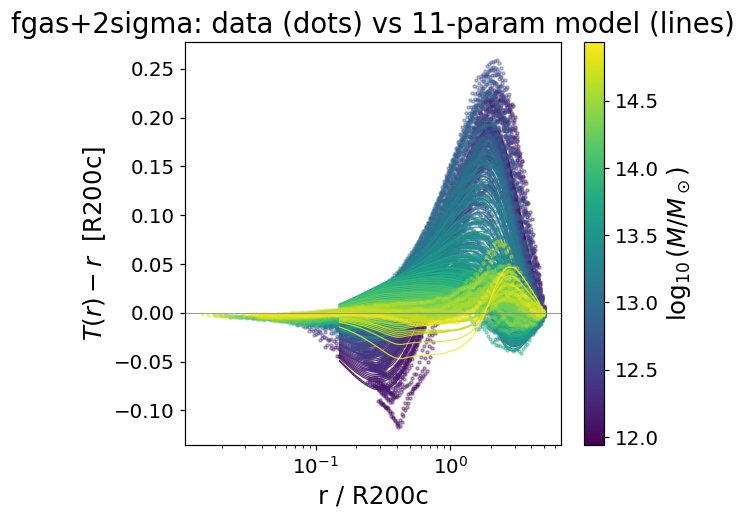

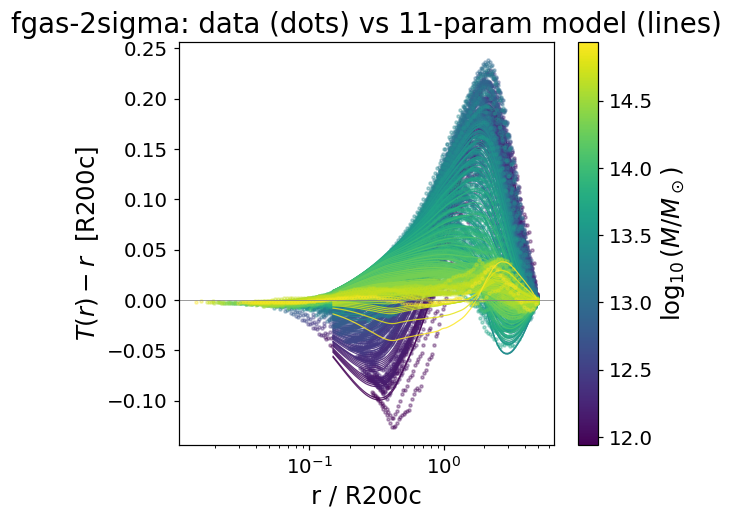

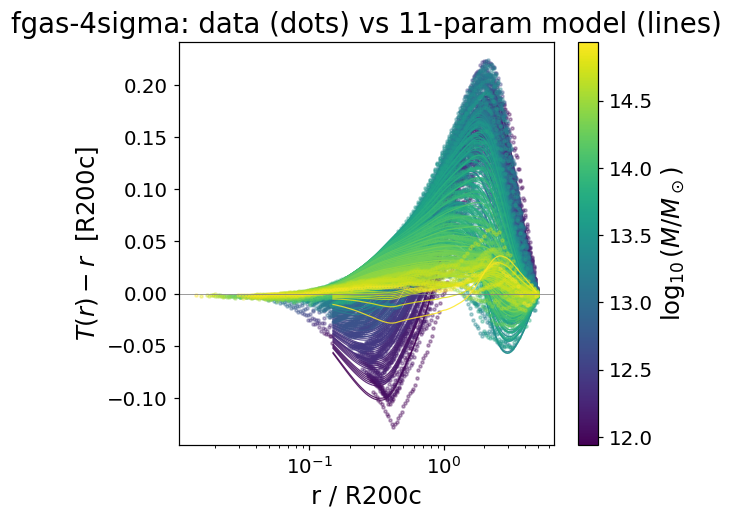

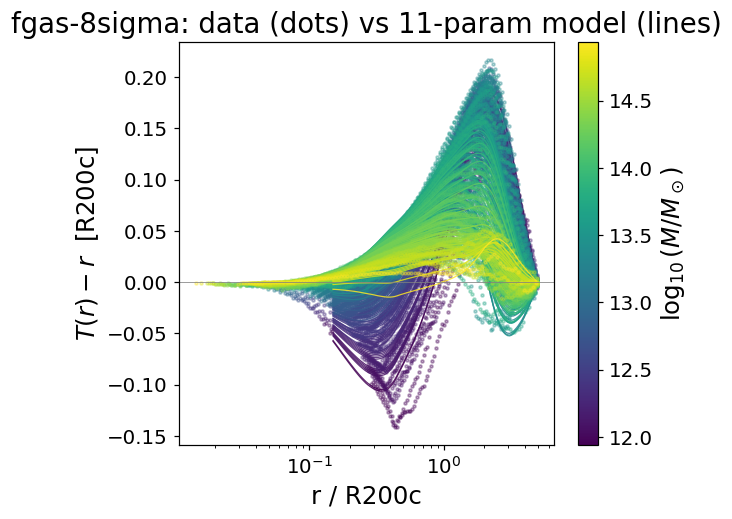

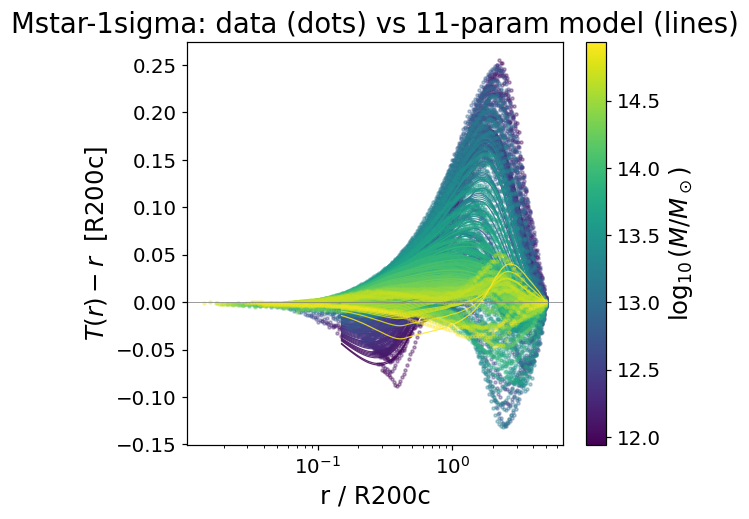

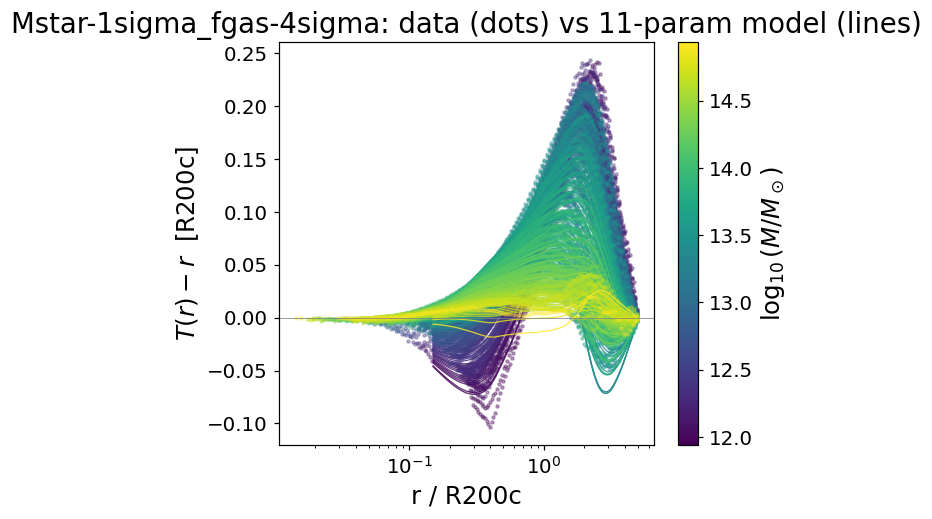

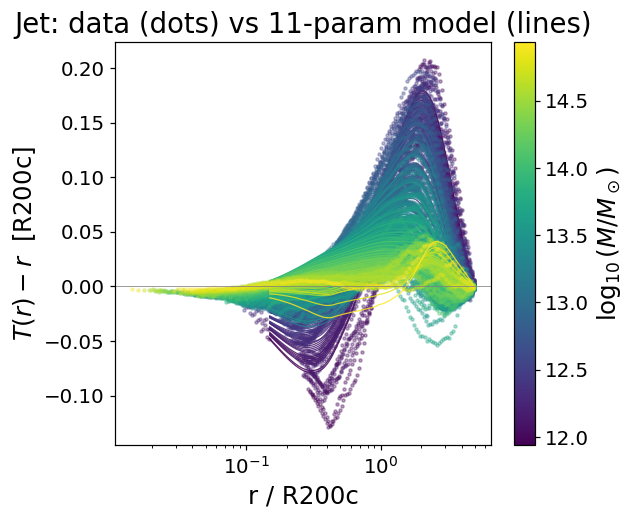

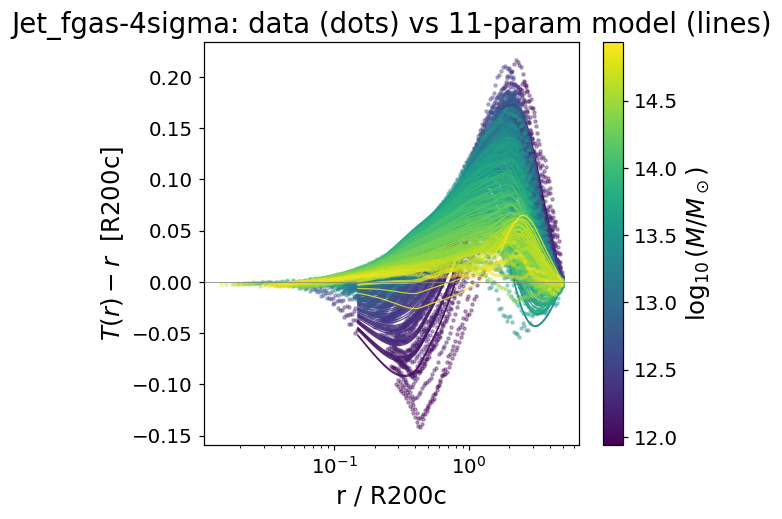

In [70]:
# per sim, single panel: data (dots) vs 11-param model reconstruction (lines), colored by mass
def plot_sim_overlay_fit(sim, bins_=bins_):
    rows = [b for b in bins_ if b["sim"] == sim]
    if not rows:
        print(f"no bins for {sim}"); return
    logM_all = [b["logM"] for b in rows]
    norm = mpl.colors.Normalize(vmin=min(logM_all), vmax=max(logM_all))
    cmap = mpl.cm.viridis

    fig, ax = plt.subplots(figsize=(6, 5))
    for b in sorted(rows, key=lambda b: b["logM"]):
        color = cmap(norm(b["logM"]))
        ax.plot(b["rc"], b["ot_amp"], "o", color=color, ms=2, alpha=.35)
        ax.plot(R_GRID, predict_curve(sim, b["logM"], b["z"]), "-", color=color, lw=.8, alpha=.85)
    ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
    ax.set_xlabel("r / R200c"); ax.set_ylabel(r"$T(r)-r$  [R200c]")
    sm = mpl.cm.ScalarMappable(norm=norm, cmap=cmap); sm.set_array([])
    fig.colorbar(sm, ax=ax, label=r"$\log_{10}(M/M_\odot)$")
    ax.set_title(f"{sim}: data (dots) vs 11-param model (lines)")
    plt.tight_layout(); plt.show()

for sim in SIMS:
    plot_sim_overlay_fit(sim)


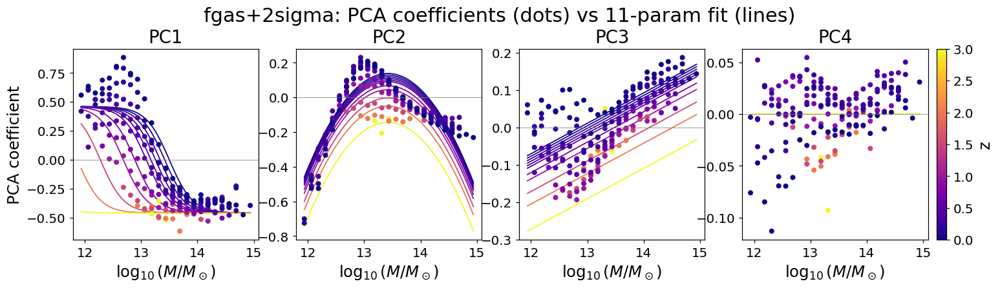

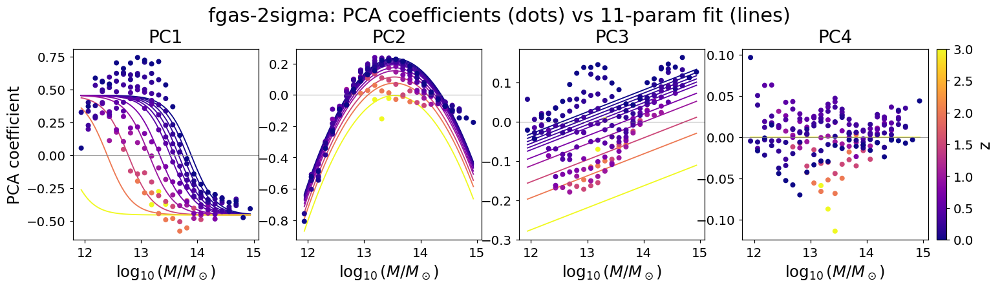

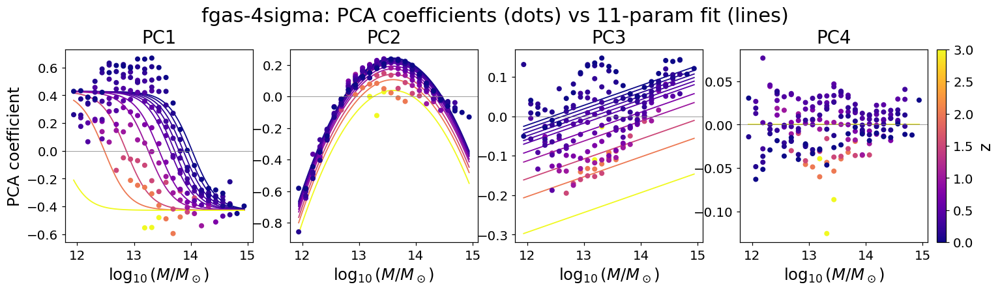

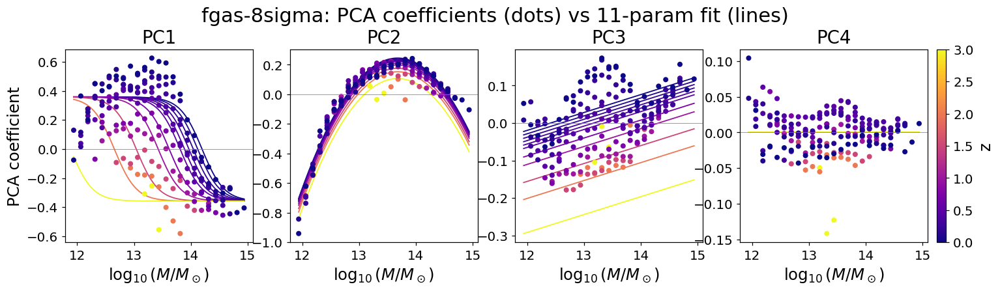

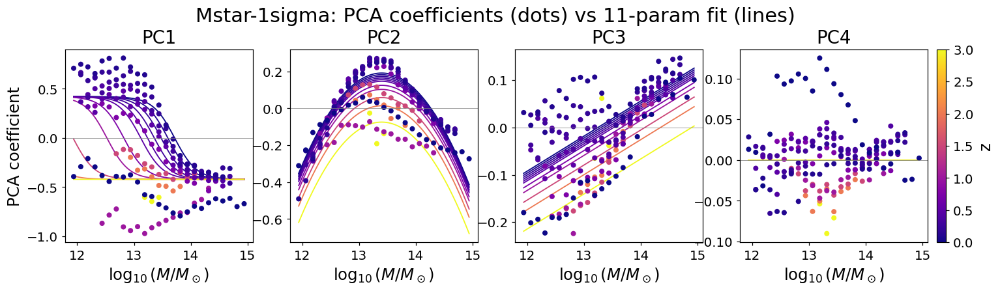

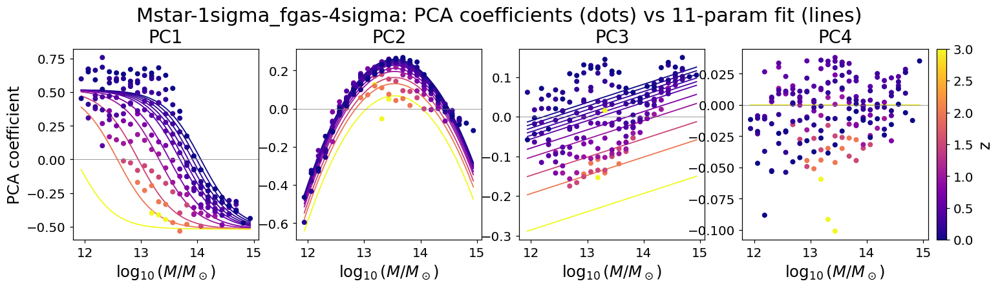

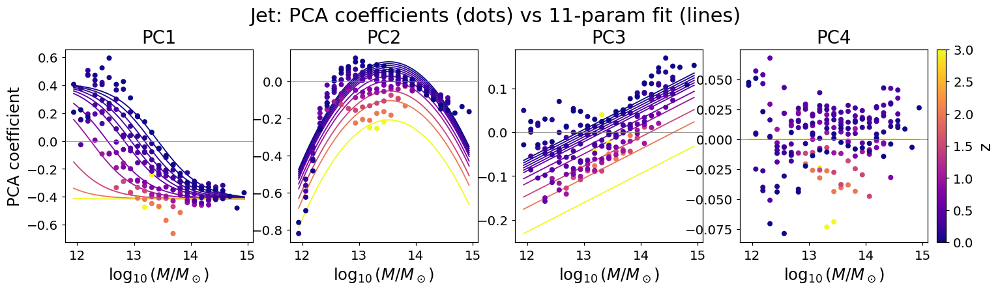

In [ ]:
# per sim: PCA coefficients (dots) with the fitted analytic curve (lines, one per snapshot z) --
# PC4's "fit" is just the flat line at 0, showing exactly what's given up by dropping it
def plot_pca_fit_vs_mz(sim, meta=meta):
    sub = meta[meta.sim == sim]
    if sub.empty:
        print(f"no bins for {sim}"); return
    norm = mpl.colors.Normalize(vmin=sub.z.min(), vmax=sub.z.max())
    cmap = mpl.cm.plasma
    logM_grid = np.linspace(sub.logM.min(), sub.logM.max(), 100)
    fig, axes = plt.subplots(1, 4, figsize=(16, 3.5), sharex=True)
    for i, ax in enumerate(axes):
        sc = ax.scatter(sub.logM, sub[f"pc{i+1}"], c=sub.z, cmap=cmap, norm=norm, s=18, zorder=2)
        for z_val in sorted(sub.z.unique()):
            pcs = predict_pcs(sim, logM_grid, np.full_like(logM_grid, z_val))
            ax.plot(logM_grid, pcs[:, i], "-", color=cmap(norm(z_val)), lw=1.2, zorder=1)
        ax.set_xlabel(r"$\log_{10}(M/M_\odot)$"); ax.set_title(f"PC{i+1}")
        ax.axhline(0, color="gray", lw=.5)
    axes[0].set_ylabel("PCA coefficient")
    fig.colorbar(sc, ax=axes, pad=.01, fraction=.02, label="z")
    fig.suptitle(f"{sim}: PCA coefficients (dots) vs 11-param fit (lines)", y=1.05)
    plt.show()

for sim in SIMS:
    plot_pca_fit_vs_mz(sim)


In [ ]:
# individual bins, one curve per panel: dots=data, line=model, laid out in a grid ordered by
# mass (rows, increasing down) and z (columns, decreasing -- same convention as the snapshot
# grids above). Picks n_mass/n_z evenly-spaced values actually present for that sim and shows
# the nearest real bin to each target.
def plot_bin_examples(sim, n_mass=4, n_z=4, bins_=bins_):
    rows_sim = [b for b in bins_ if b["sim"] == sim]
    if not rows_sim:
        print(f"no bins for {sim}"); return

    zs = sorted({b["z"] for b in rows_sim}, reverse=True)
    z_targets = [zs[i] for i in sorted(set(np.linspace(0, len(zs) - 1, min(n_z, len(zs))).round().astype(int)))]
    masses = sorted({b["logM"] for b in rows_sim})
    m_targets = [masses[i] for i in sorted(set(np.linspace(0, len(masses) - 1, min(n_mass, len(masses))).round().astype(int)))]

    nrows, ncols = len(m_targets), len(z_targets)
    fig, axes = plt.subplots(nrows, ncols, figsize=(3.2*ncols, 2.8*nrows), sharex=True)
    axes = np.atleast_2d(axes)
    for i, m_t in enumerate(m_targets):
        for j, z_t in enumerate(z_targets):
            ax = axes[i, j]
            cand = [b for b in rows_sim if b["z"] == z_t]
            if not cand:
                ax.axis("off"); continue
            b = min(cand, key=lambda b: abs(b["logM"] - m_t))
            ax.plot(b["rc"], b["ot_amp"], "o", color="C0", ms=3, alpha=.6, label="data")
            ax.plot(R_GRID, predict_curve(sim, b["logM"], b["z"]), "-", color="C1", lw=1.5, label="fit")
            ax.set_xscale("log"); ax.axhline(0, color="gray", lw=.5)
            ax.set_title(f"logM={b['logM']:.2f}, z={b['z']:g}, n={b['n_halos']}", fontsize=9)
    for ax in axes[-1, :]:
        ax.set_xlabel("r / R200c")
    for ax in axes[:, 0]:
        ax.set_ylabel(r"$T(r)-r$")
    axes[0, 0].legend(fontsize=8)
    fig.suptitle(f"{sim}: example bins (rows: mass ↑, cols: z ↓) -- dots=data, line=fit", y=1.02)
    plt.tight_layout(); plt.show()

for sim in ["fgas-4sigma", "Mstar-1sigma"]:
    plot_bin_examples(sim)


# Bootstrap error on the average OT map, every bin in `profiles_v5_10k.hdf5`

For each `status=="ok"` bin: resample its `n_halos` halos with replacement (standard
nonparametric bootstrap), recompute `avg_dmo`/`avg_hyd` exactly as `Build_profiles_10k.ipynb`'s
`ot_one_bin` does (the mean over halos that actually contributed >=1 particle on that side --
`has_dmo`/`has_hyd`), then recompute the OT map with the same `Func_for_fit.ot_map_from_hists`
used everywhere else in this pipeline. Repeat `N_BOOT` times and take the per-radius std across
replicates as the bootstrap error on `T(r)` -- identical to the error on the displacement
amplitude `T(r) - r`, since subtracting the fixed `rc` grid doesn't add variance.

Implementation note: resampling is vectorized via per-halo bootstrap *counts* (`np.bincount` of
the resampled indices) rather than literally rebuilding a resampled array, so each replicate's
average is one weighted matrix-vector product -- this is what keeps ~3800 bins x 200 replicates
tractable (measured ~0.9s/200 reps at `n_halos=10000`, the worst case; most bins have far fewer
halos, so it's faster in practice than the 3800 x 0.9s upper bound suggests).

Bins with `status != "ok"` (`no_halos`) have no per-halo data to resample and are skipped.
Saves one row per (bin, radial point) to `bootstrap_v5.csv`.

In [ ]:
import sys
sys.path.insert(0, PATH)
import Func_for_fit as F
from tqdm.auto import tqdm

N_BOOT = 200
BOOT_SEED = 0

def bootstrap_bin(g, n_boot=N_BOOT, rng=None):
    """Bootstrap-resample the halos in one 'ok' bin. Returns (rc, ot, ot_std_boot)."""
    m_dmo = g["m_dmo"][...]; m_hyd = g["m_hyd"][...]
    has_dmo = g["has_dmo"][...]; has_hyd = g["has_hyd"][...]
    edges = g["edges"][...]; rc = g["rc"][...]; ot = g["ot"][...]
    n = m_dmo.shape[0]
    ot_boot = np.full((n_boot, len(rc)), np.nan)
    for b in range(n_boot):
        for _attempt in range(5):   # guards tiny-n_halos bins where a resample can miss has_*
            idx = rng.integers(0, n, size=n)
            counts = np.bincount(idx, minlength=n)
            cd, ch = counts[has_dmo], counts[has_hyd]
            if cd.sum() > 0 and ch.sum() > 0:
                avg_dmo_b = (cd @ m_dmo[has_dmo]) / cd.sum()
                avg_hyd_b = (ch @ m_hyd[has_hyd]) / ch.sum()
                ot_boot[b] = F.ot_map_from_hists(edges, avg_dmo_b, avg_hyd_b, rc)
                break
    return rc, ot, np.nanstd(ot_boot, axis=0)

ok_bins = [(snap, sim, key) for snap in f5 for sim in f5[snap] for key in f5[snap][sim]
           if f5[snap][sim][key].attrs.get("status") == "ok"]
seeds = np.random.SeedSequence(BOOT_SEED).spawn(len(ok_bins))
print(f"{len(ok_bins)} 'ok' bins to bootstrap (of {n5} total in v5), N_BOOT={N_BOOT}")

rows = []
for (snap, sim, key), seed in tqdm(list(zip(ok_bins, seeds)), total=len(ok_bins)):
    g = f5[snap][sim][key]
    lo, hi = g.attrs["lo"], g.attrs["hi"]
    rc, ot, ot_std = bootstrap_bin(g, rng=np.random.default_rng(seed))
    z = SNAP_Z.get(int(snap), np.nan)
    for r_idx in range(len(rc)):
        rows.append(dict(snap=snap, sim=sim, lo=float(lo), hi=float(hi), z=z,
                          logM=float(lo + hi) / 2, n_halos=int(g.attrs["n_halos"]),
                          r_idx=r_idx, rc=float(rc[r_idx]), ot=float(ot[r_idx]),
                          ot_std_boot=float(ot_std[r_idx])))

boot_df = pd.DataFrame(rows)
boot_df.to_csv("bootstrap_v5.csv", index=False)
n_bins_saved = boot_df[["snap", "sim", "lo", "hi"]].drop_duplicates().shape[0]
print(f"saved {len(boot_df)} rows ({n_bins_saved} bins x {boot_df.r_idx.max()+1} radial points) "
      f"to bootstrap_v5.csv")
boot_df.head()


# How much bigger is v3's error than v5's?

Two magnitudes, both computed the same way for each file so the comparison is apples-to-apples,
restricted to the **same physical bins** present in both (`profiles_v3.hdf5` is a strict subset
of `profiles_v5_10k.hdf5`'s bins -- 2047 of v5's 3838 "offset 0" bins also exist in v3):

1. **Bootstrap error** -- v3's own precomputed bootstrap std (`slide_avg_hist_0.00000.csv`'s
   `ot_disp_std`, at the un-shifted bin placement) vs v5's precomputed bootstrap std
   (`bootstrap_v5.csv`'s `ot_std_boot`, from `bootstrap_bin()` above) -- both are each file's
   own authoritative bootstrap number, so no re-derivation needed.
2. **Bin-placement error** -- std across each file's own 4 quarter-bin-offset slides
   (v3: `slide_avg_hist_{0,0.03125,0.0625,0.09375}.csv`; v5: `bootstrap_v5.csv` +
   `bootstrap_slide_v5_{0.03125,0.0625,0.09375}.csv`), matched bin-by-bin via nearest mass and
   interpolated onto the offset-0 bin's own `rc` grid -- same method `fit_v5_fgas.ipynb`'s
   `BIN_STD_GRID` uses.

**Why this matters:** v3 caps at 1000 halos/bin, v5 at 10000 -- a 10x difference wherever that
cap actually binds. Pure shot noise predicts the bootstrap std should shrink by `sqrt(10) ~
3.16x` going from v3 to v5 in those capped bins; matching that number is a good sanity check
that both pipelines' bootstrap machinery means the same thing.

In [71]:
SLIDE_OFFS = [0.03125, 0.0625, 0.09375]

v3_off0 = pd.read_csv(f"{PATH}slide_avg_hist_0.00000.csv")
v3_offs = {off: pd.read_csv(f"{PATH}slide_avg_hist_{off:.5f}.csv") for off in SLIDE_OFFS}
for d in [v3_off0, *v3_offs.values()]:
    d["logM"] = (d.logM_lo + d.logM_hi) / 2
    d["logM_lo_r"] = d.logM_lo.round(3)

v5_off0 = pd.read_csv(f"{PATH}bootstrap_v5.csv")
v5_offs = {off: pd.read_csv(f"{PATH}bootstrap_slide_v5_{off:.5f}.csv", dtype={"snap": "int64"})
           for off in SLIDE_OFFS}
v5_off0 = v5_off0[v5_off0.sim.isin(SIMS)].copy()
v5_off0["lo_r"] = v5_off0.lo.round(3)
v5_off0["ot_disp"] = v5_off0.ot - v5_off0.rc
for off in SLIDE_OFFS:
    v5_offs[off] = v5_offs[off][v5_offs[off].sim.isin(SIMS)].copy()
    v5_offs[off]["ot_disp"] = v5_offs[off].ot - v5_offs[off].rc

# restrict to bins present in BOTH files (v3 is a strict subset of v5's bins by construction)
v3_bins = set(zip(v3_off0.snap, v3_off0.sim, v3_off0.logM_lo_r))
v5_bins = set(zip(v5_off0.snap, v5_off0.sim, v5_off0.lo_r))
common = v3_bins & v5_bins
print(f"v3 bins: {len(v3_bins)}  v5 bins: {len(v5_bins)}  common (used below): {len(common)}")

v3_off0_c = v3_off0[v3_off0.set_index(["snap", "sim", "logM_lo_r"]).index.isin(common)].copy()
v5_off0_c = v5_off0[v5_off0.set_index(["snap", "sim", "lo_r"]).index.isin(common)].copy()

print("\n" + "=" * 66)
print("PART A: bootstrap error magnitude, v3 (NMAX=1000) vs v5 (NMAX=10000)")
print("=" * 66)
v3_boot = v3_off0_c.dropna(subset=["ot_disp_std"])
v5_boot = v5_off0_c.dropna(subset=["ot_std_boot"])
print(f"v3: mean={v3_boot.ot_disp_std.mean():.5f}  median={v3_boot.ot_disp_std.median():.5f}  (n={len(v3_boot)})")
print(f"v5: mean={v5_boot.ot_std_boot.mean():.5f}  median={v5_boot.ot_std_boot.median():.5f}  (n={len(v5_boot)})")
print(f"ratio of means, v3/v5: {v3_boot.ot_disp_std.mean() / v5_boot.ot_std_boot.mean():.2f}x")

cmp_boot = pd.DataFrame({
    "v3": v3_boot.groupby("sim").ot_disp_std.mean().reindex(SIMS),
    "v5": v5_boot.groupby("sim").ot_std_boot.mean().reindex(SIMS),
})
cmp_boot["ratio_v3/v5"] = cmp_boot.v3 / cmp_boot.v5
print("\nper-sim mean bootstrap std (same bins in both):")
print(cmp_boot.round(5))

# sanity check: in bins where v3 actually hit its 1000-halo cap, v5 has ~10x more halos there --
# pure shot noise predicts the bootstrap std should shrink by sqrt(10)~3.16x
v3n = v3_off0_c.groupby(["snap", "sim", "logM_lo_r"]).n_halos.first()
capped_idx = v3n[v3n >= 995].index
v3_capped = v3_off0_c.set_index(["snap", "sim", "logM_lo_r"]).loc[capped_idx].ot_disp_std.dropna()
v5_capped = v5_off0_c.set_index(["snap", "sim", "lo_r"]).loc[list(capped_idx)].ot_std_boot.dropna()
print(f"\nsanity check -- {len(capped_idx)} of {len(common)} common bins have v3 at its 1000-halo cap:")
print(f"  v3 mean std (capped only): {v3_capped.mean():.5f}")
print(f"  v5 mean std (same bins):   {v5_capped.mean():.5f}")
print(f"  ratio: {v3_capped.mean()/v5_capped.mean():.2f}x  (pure-shot-noise expectation: sqrt(10)=3.16x)")

v3 bins: 2047  v5 bins: 3838  common (used below): 2047

PART A: bootstrap error magnitude, v3 (NMAX=1000) vs v5 (NMAX=10000)
v3: mean=0.01723  median=0.01180  (n=140409)
v5: mean=0.01001  median=0.00448  (n=204700)
ratio of means, v3/v5: 1.72x

per-sim mean bootstrap std (same bins in both):
                               v3       v5  ratio_v3/v5
sim                                                    
fgas+2sigma               0.01685  0.00883      1.90873
fgas-2sigma               0.01709  0.01085      1.57469
fgas-4sigma               0.01721  0.00901      1.91055
fgas-8sigma               0.01711  0.01061      1.61275
Mstar-1sigma              0.01766  0.01053      1.67718
Mstar-1sigma_fgas-4sigma  0.01729  0.01004      1.72273
Jet                       0.01710  0.00953      1.79317
Jet_fgas-4sigma           0.01754  0.01072      1.63662



sanity check -- 1339 of 2047 common bins have v3 at its 1000-halo cap:
  v3 mean std (capped only): 0.01727
  v5 mean std (same bins):   0.00551
  ratio: 3.13x  (pure-shot-noise expectation: sqrt(10)=3.16x)


In [72]:
def bin_placement_std(off0_df, offs_dfs, mass_col, val_col, rc_col="rc", sim_col="sim", snap_col="snap"):
    """For each (snap, sim, bin) in off0_df: find the nearest-mass bin in each of the other 3
    offsets, interpolate its curve (log-r) onto off0's own rc grid, then take the pointwise std
    across [off0's own curve] + [3 interpolated curves]. One row per (bin, rc-point)."""
    out = []
    for (snap, sim, mass), g in off0_df.groupby([snap_col, sim_col, mass_col], sort=False):
        g = g.sort_values(rc_col)
        rc0 = g[rc_col].values
        curves = [g[val_col].values]
        for off, df in offs_dfs.items():
            sub = df[(df[snap_col] == snap) & (df[sim_col] == sim)]
            if sub.empty:
                continue
            masses = sub[mass_col].drop_duplicates().values
            nearest_mass = masses[np.argmin(np.abs(masses - mass))]
            gg = sub[sub[mass_col] == nearest_mass].sort_values(rc_col)
            if len(gg) < 2:
                continue
            interp_val = np.interp(np.log(rc0), np.log(gg[rc_col].values), gg[val_col].values,
                                    left=np.nan, right=np.nan)
            curves.append(interp_val)
        curves = np.array(curves)
        std = np.nanstd(curves, axis=0) if curves.shape[0] >= 2 else np.full(len(rc0), np.nan)
        out.append(pd.DataFrame({"snap": snap, "sim": sim, mass_col: mass, "bin_std": std}))
    return pd.concat(out, ignore_index=True)

print("=" * 66)
print("PART B: bin-placement (cross-slide) error magnitude, v3 vs v5")
print("=" * 66)
v3_bin = bin_placement_std(v3_off0_c, v3_offs, "logM", "ot_disp")
v5_bin = bin_placement_std(v5_off0_c, v5_offs, "logM", "ot_disp")

v3_bin_s, v5_bin_s = v3_bin.bin_std.dropna(), v5_bin.bin_std.dropna()
print(f"v3: mean={v3_bin_s.mean():.5f}  median={v3_bin_s.median():.5f}  (n={len(v3_bin_s)})")
print(f"v5: mean={v5_bin_s.mean():.5f}  median={v5_bin_s.median():.5f}  (n={len(v5_bin_s)})")
print(f"ratio of means, v3/v5: {v3_bin_s.mean()/v5_bin_s.mean():.2f}x")

cmp_bin = pd.DataFrame({
    "v3": v3_bin.dropna(subset=["bin_std"]).groupby("sim").bin_std.mean().reindex(SIMS),
    "v5": v5_bin.dropna(subset=["bin_std"]).groupby("sim").bin_std.mean().reindex(SIMS),
})
cmp_bin["ratio_v3/v5"] = cmp_bin.v3 / cmp_bin.v5
print("\nper-sim mean bin-placement std (same bins in both):")
print(cmp_bin.round(5))

print("\n" + "=" * 66)
print("SUMMARY")
print("=" * 66)
print(f"v3's bootstrap error is on average {v3_boot.ot_disp_std.mean()/v5_boot.ot_std_boot.mean():.1f}x "
      f"bigger than v5's (same bins) -- {v3_capped.mean()/v5_capped.mean():.1f}x in the subset where "
      f"v3's 1000-halo cap actually binds (vs. sqrt(10)=3.16x expected from shot noise alone).")
print(f"v3's bin-placement error is on average {v3_bin_s.mean()/v5_bin_s.mean():.1f}x bigger than v5's "
      f"(same bins) -- consistent with the same halo-count-driven noise floor feeding into both "
      f"error estimates, not a separate effect.")

PART B: bin-placement (cross-slide) error magnitude, v3 vs v5


v3: mean=0.00915  median=0.00446  (n=204700)
v5: mean=0.00613  median=0.00272  (n=204700)
ratio of means, v3/v5: 1.49x

per-sim mean bin-placement std (same bins in both):
                               v3       v5  ratio_v3/v5
sim                                                    
fgas+2sigma               0.00810  0.00524      1.54729
fgas-2sigma               0.00927  0.00644      1.43813
fgas-4sigma               0.00916  0.00607      1.50743
fgas-8sigma               0.00952  0.00656      1.45160
Mstar-1sigma              0.00981  0.00672      1.45914
Mstar-1sigma_fgas-4sigma  0.00868  0.00562      1.54546
Jet                       0.00908  0.00566      1.60393
Jet_fgas-4sigma           0.00967  0.00675      1.43286

SUMMARY
v3's bootstrap error is on average 1.7x bigger than v5's (same bins) -- 3.1x in the subset where v3's 1000-halo cap actually binds (vs. sqrt(10)=3.16x expected from shot noise alone).
v3's bin-placement error is on average 1.5x bigger than v5's (same bins) --